<a href="https://colab.research.google.com/github/Daniela-Toro/Pump-it-Up-Data-Mining-the-Water-Table/blob/main/Proyecto_Daniela_Toro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Composicion de la carpeta de entrega**

Estructura:
1. y_train
2. x_train
3. x_test
4. Pycaret_Daniela_Toro (Archivo de apoyo para valorar el df modificado en distintos algoritmos)
5. Proyecto_Daniela_Toro (Archivo principal)

Las predicciones, archivos pickle y los csv se crean en su ejecución. El proyecto fue desarrollado en Google Colab, por lo que las lecturas de archivos se realizaron desde la nube, sin embargo, se dejan bloques de código para leer los archivos en caso de ejecutarse desde el ordenador local (misma carpeta del proyecto)


# **Predicción del Estado de Bombas de Agua en Tanzania**

El objetivo es predecir el estado funcional de bombas de agua en Tanzania utilizando técnicas de aprendizaje automático multiclase. Los posibles estados son: **funcional**, **no funcional** y **funcional que necesita reparación**.
Para realizar las predicciones, se han proporcionado datos con aproximadamente 50 variables, entre ellas:

- `amount_tsh`: Cantidad de agua disponible (altura estática total)
- `date_recorded`: Fecha de registro de los datos
- `funder`: Entidad financiadora del pozo
- `gps_height`: Altitud del pozo
- `installer`: Organización que instaló el pozo
- `longitude`, `latitude`: Coordenadas GPS
- `wpt_name`: Nombre del punto de agua
- `basin`, `subvillage`, `region`, `district_code`, `lga`, `ward`, `region_code`: Ubicación geográfica
- `population`: Población en torno al punto de agua
- `public_meeting`, `permit`: Indicadores booleanos sobre permisos y reuniones públicas
- `construction_year`: Año de construcción del pozo
- `recorded_by`, `scheme_management`, `scheme_name`: Información sobre el registro y gestión del pozo
- `extraction_type`, `extraction_type_group`, `extraction_type_class`: Tipos de extracción de agua
- `management`, `management_group`: Formas de gestión del punto de agua
- `payment`, `payment_type`: Información sobre el costo del agua
- `water_quality`, `quality_group`: Calidad del agua
- `quantity`, `quantity_group`: Cantidad de agua disponible
- `source`, `source_type`, `source_class`: Fuente del agua
- `waterpoint_type`, `waterpoint_type_group`: Tipo de punto de agua


---

## **Importación de librerias**
En esta primera etapa, instalo e importo todas las librerías necesarias para llevar a cabo el análisis y modelado del problema. Esto incluye paquetes para manipulación de datos, visualización y librerías de machine learning. Tener esta sección bien organizada garantiza reproducibilidad y facilita el desarrollo. También se leen y guardan los datos que se utilizarán para el modelado

In [ ]:
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import missingno as msno

!pip install ydata-profiling
from ydata_profiling import ProfileReport

from scipy import stats
from scipy.stats import f_oneway

from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.impute import SimpleImputer
import sklearn.impute as skl_imp
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import KNNImputer
from sklearn.cluster import KMeans

from sklearn.model_selection import train_test_split
from sklearn.linear_model import BayesianRidge
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from xgboost import XGBClassifier

!pip install feature-engine
import feature_engine.imputation as fe_imp

from imblearn.over_sampling import SMOTE

from sklearn.metrics import (
    accuracy_score,
    f1_score,
    precision_score,
    recall_score,
    auc,
    roc_curve,
    confusion_matrix,
    classification_report
)

import pickle

## **Lectura de Datos**

Como se trabaja desde Colab es necesario acceder a drive y luego a la ruta con los csv

In [ ]:
# Montar Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Lectura de datos
df_train = pd.read_csv('/content/drive/My Drive/ML Tarea/x_train.csv', parse_dates=['date_recorded'])
df_variable_dependiente = pd.read_csv("/content/drive/My Drive/ML Tarea/y_train.csv")
df_test = pd.read_csv("/content/drive/My Drive/ML Tarea/x_test.csv",parse_dates=['date_recorded'])

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Cargar los DataFrames desde archivos locales
# df_train = pd.read_csv("x_train.csv", parse_dates=["date_recorded"])
# df_variable_dependiente = pd.read_csv("y_train.csv")
# df_test = pd.read_csv("x_test.csv", parse_dates=["date_recorded"])

---

# **Análisis exploratorio**
Antes de construir cualquier modelo, realizo un análisis exploratorio de los datos para comprender su estructura y características. Examino la distribución de cada variable, tanto numérica como categórica, y busco valores nulos, duplicados, inconsistencias o errores evidentes son un simple analisis. También identifico correlaciones entre variables, patrones geográficos o temporales relevantes, y la distribución de la variable objetivo, especialmente en problemas de clasificación multiclase. Esta etapa es crucial para orientar decisiones en el preprocesamiento y la selección de modelos.

In [ ]:
# Analisis de la variable objetivo
df_variable_dependiente

,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional
...,...,...
59395,60739,functional
59396,27263,functional
59397,37057,functional
59398,31282,functional


In [ ]:
# Ver balance de categorías de la variable dependiente
conteo = df_variable_dependiente['status_group'].value_counts().sort_index()
porcentaje = (conteo / conteo.sum()) * 100
resumen = pd.DataFrame({'count': conteo,'percentage': porcentaje.round(2)})
resumen

,count,percentage
status_group,,
functional,32259,54.31
functional needs repair,4317,7.27
non functional,22824,38.42


Se puede observar que la variable objetivo (dependiente) tiene un desbalance entre las categorías, con un 54.31% del total son functional, 7.27% functional needs repair y 38.42% non functional. Esto sugiere que se necesitará balancear las categorías posteriormente.


## **Análisis numérico**

In [ ]:
df_train.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


---

In [ ]:
# Ver tipo de dato y cantidad de valores no nulos
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   id                     59400 non-null  int64         
 1   amount_tsh             59400 non-null  float64       
 2   date_recorded          59400 non-null  datetime64[ns]
 3   funder                 55763 non-null  object        
 4   gps_height             59400 non-null  int64         
 5   installer              55745 non-null  object        
 6   longitude              59400 non-null  float64       
 7   latitude               59400 non-null  float64       
 8   wpt_name               59398 non-null  object        
 9   num_private            59400 non-null  int64         
 10  basin                  59400 non-null  object        
 11  subvillage             59029 non-null  object        
 12  region                 59400 non-null  object        
 13  r

In [ ]:
# Cantidad de nulos por variable
missing_summary = pd.DataFrame({
    'missing_count': df_train.isnull().sum(),
    'missing_pct': df_train.isnull().mean()
}).sort_values(by='missing_count', ascending=False)

missing_summary

,missing_count,missing_pct
scheme_name,28810,0.485017
scheme_management,3878,0.065286
installer,3655,0.061532
funder,3637,0.061229
public_meeting,3334,0.056128
permit,3056,0.051448
subvillage,371,0.006246
wpt_name,2,0.000034
latitude,0,0.000000
longitude,0,0.000000


Existen variables afectadas por valores nulos. La variable más afcetada es scheme_name, tiene 48.5% de valores faltantes, lo cual es muy alto. El resto de variables afectadas con valores nulos no contiene un exceso preocupante, que se podría mitigar con imputaciones

In [ ]:
# Informacion variables continuas
df_train.describe()

,id,amount_tsh,date_recorded,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000000,59400.000000,59400,59400.000000,59400.000000,5.940000e+04,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,37115.131768,317.650385,2012-03-29 09:11:33.818181888,668.297239,34.077427,-5.706033e+00,0.474141,15.297003,5.629747,179.909983,1300.652475
min,0.000000,0.000000,2002-10-14 00:00:00,-90.000000,0.000000,-1.164944e+01,0.000000,1.000000,0.000000,0.000000,0.000000
25%,18519.750000,0.000000,2011-04-01 00:00:00,0.000000,33.090347,-8.540621e+00,0.000000,5.000000,2.000000,0.000000,0.000000
50%,37061.500000,0.000000,2012-10-10 00:00:00,369.000000,34.908743,-5.021597e+00,0.000000,12.000000,3.000000,25.000000,1986.000000
75%,55656.500000,20.000000,2013-02-09 00:00:00,1319.250000,37.178387,-3.326156e+00,0.000000,17.000000,5.000000,215.000000,2004.000000
max,74247.000000,350000.000000,2013-12-03 00:00:00,2770.000000,40.345193,-2.000000e-08,1776.000000,99.000000,80.000000,30500.000000,2013.000000
std,21453.128371,2997.574558,NaN,693.116350,6.567432,2.946019e+00,12.236230,17.587406,9.633649,471.482176,951.620547


- id: No aporta, conveniente eliminarlo
- longitude, latitude: Pueden tener relacion con las variables categoricas de ubicacion,, por tanto es conveniente analizarlas y ver si aportan la misma informacion, en ese caso, quedarnos con las mas relevantes. Tiene missing no declarado, Tanzania no tiene longitud 0 ya que no pasa por el meridiano de Greenwich
- amount_tsh: Posee valores atípicos, mediana en 0 con media de 317, desviacion alta
- num_private: Posee valores atípicos, maximo extremadamente alto, missing no declarados
- region_code, district_code: mismo caso de longitude y latitude, con missing no declarados
- population: Puede tener valores atípicos o missing no declarados (Puede ser que los posos no esten cercanos a poblaciones, aunque por logica deberia ser poco probable)
- construction_year: Posee missings no declarados con 0

In [ ]:
# Cantidad de valores únicos por variable
df_train.select_dtypes(exclude=np.number).nunique().sort_values(ascending=False)

,0
wpt_name,37399
subvillage,19287
scheme_name,2695
installer,2145
ward,2092
funder,1896
date_recorded,356
lga,125
region,21
extraction_type,18


In [ ]:
# Informacion variables categóricas
df_train.select_dtypes(exclude=['number', 'datetime']).describe()

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,recorded_by,scheme_management,scheme_name,permit,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
count,55763,55745,59398,59400,59029,59400,59400,59400,56066,59400,55522,30590,56344,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400
unique,1896,2145,37399,9,19287,21,125,2092,2,1,11,2695,2,18,13,7,12,5,7,7,8,6,5,5,10,7,3,7,6
top,Government Of Tanzania,DWE,none,Lake Victoria,Madukani,Iringa,Njombe,Igosi,True,GeoData Consultants Ltd,VWC,K,True,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
freq,9084,17402,3563,10248,508,5294,2503,307,51011,59400,36793,682,38852,26780,26780,26780,40507,52490,25348,25348,50818,50818,33186,33186,17021,17021,45794,28522,34625


## **Análisis visual**

In [ ]:
profile = ProfileReport(df_train, title = "Reporting")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 40/40 [00:13<00:00,  3.03it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Análisis por Variable

| **Variables Analizadas**                            | **Observaciones**                                                                 |
|-----------------------------------------------------|-----------------------------------------------------------------------------------|
| id                                                  | Valores únicos                                                                   |
| amount_tsh                                          | Casi todos los valores en 0                                                      |
| date_recorded                                       | Útil para calcular antigüedad de la bomba                                        |
| funder                                              | Tiene nulos, sin correlación alta                                                |
| gps_height                                          | Exceso de 0 y valores negativos, distribución bimodal                           |
| installer                                           | Missing no declarados, muchas categorías                                         |
| longitude, latitude                                 | Valores en 0, correlación alta con variables geográficas                        |
| wpt_name                                            | Muchas categorías, poco valor predictivo                                        |
| num_private                                         | No se conoce qué es, muchos ceros                                                |
| basin                                               | Alta correlación con variables geográficas                                      |
| region                                              | Correlación alta con otras variables geográficas                                |
| region_code                                         | Redundante con region                                                           |
| district_code                                       | Errores en codificación                                                         |
| lga, ward                                           | Muchas categorías, redundantes                                                  |
| population                                          | Exceso de valores 0                                                             |
| recorded_by                                         | No aporta información                                                           |
| public_meeting                                      | Desbalanceada y con perdidos                                                    |
| scheme_name                                         | Casi un 50% de perdidos                                                         |
| management, management_group, scheme_management    | Posible duplicación de información                                             |
| permit                                              | Missings                                                                        |
| construction_year                                   | Missings no declarados con 0                                                    |
| extraction_type, extraction_type_group, extraction_type_class | Alta correlación entre ellas                                      |
| payment, payment_type                              | Misma información con nombres distintos                                         |
| water_quality, quality_group                       | Alta correlación                                                                |
| quantity, quantity_group                           | Son la misma variable                                                           |
| source, source_type, source_group                  | Altamente correlacionadas                                                       |
| waterpoint_type, waterpoint_type_group             | Alta correlación con extraction_type                                            |
| status_group (target)                              | 54.3% functional, 38.4% non-functional, 7.3% needs repair                      |

In [ ]:
# Annadirle status_group para ver relacion de variables con la VO
df_train_all = df_train.merge(df_variable_dependiente, on='id')
df_train_all.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


In [ ]:
df_train_all['date_recorded_year'] = df_train_all['date_recorded'].dt.year
df_train_all['date_recorded_month'] = df_train_all['date_recorded'].dt.month
df_train_all['date_recorded_day'] = df_train_all['date_recorded'].dt.day
df_train_all.drop(columns='date_recorded', inplace=True)
df_train_all.head()

,id,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,date_recorded_year,date_recorded_month,date_recorded_day
0,69572,6000.0,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,2011,3,14
1,8776,0.0,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,2013,3,6
2,34310,25.0,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional,2013,2,25
3,67743,0.0,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional,2013,1,28
4,19728,0.0,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,2011,7,13


In [ ]:
# Analizar la relacion de las variables predictoras con la VO
# Función para calcular VCramer con dos nominales de entrada
def cramers_v(var1, varObj):
    if not var1.dtypes.name == 'object':
        #bins = min(5,var1.value_counts().count())
        var1 = pd.cut(var1, bins = 5)
    if not varObj.dtypes.name == 'object': #np.issubdtype(varObj, np.number):
        #bins = min(5,varObj.value_counts().count())
        varObj = pd.cut(varObj, bins = 5)

    data = pd.crosstab(var1, varObj).values
    vCramer = stats.contingency.association(data, method = 'cramer')
    return vCramer

In [ ]:
# Obtener el gráfico de importancia de las variables frente a la objetivo continua según vcramer
tablaCramer = pd.DataFrame(df_train.apply(lambda x: cramers_v(x,df_variable_dependiente['status_group'])),columns=['VCramer'])
px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente a status_group').update_yaxes(categoryorder="total ascending").show()

/usr/local/lib/python3.11/dist-packages/scipy/stats/contingency.py:512: RuntimeWarning:

invalid value encountered in scalar divide




Variable numérica: id
F-statistic: 0.4893 | p-valor: 0.6130
No se detectan diferencias significativas


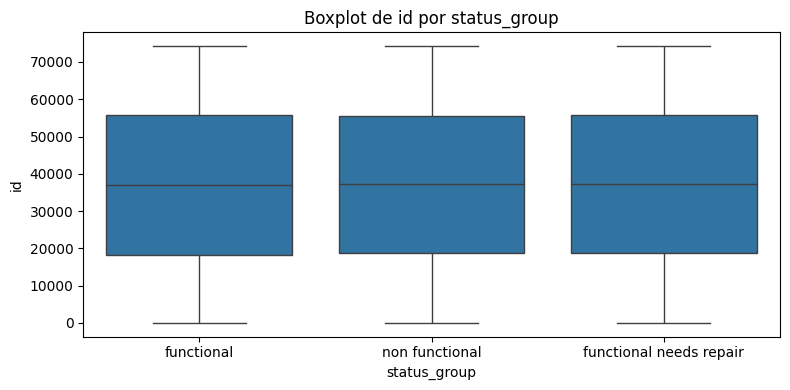


Variable numérica: amount_tsh
F-statistic: 86.0423 | p-valor: 0.0000
Diferencias significativas entre los grupos


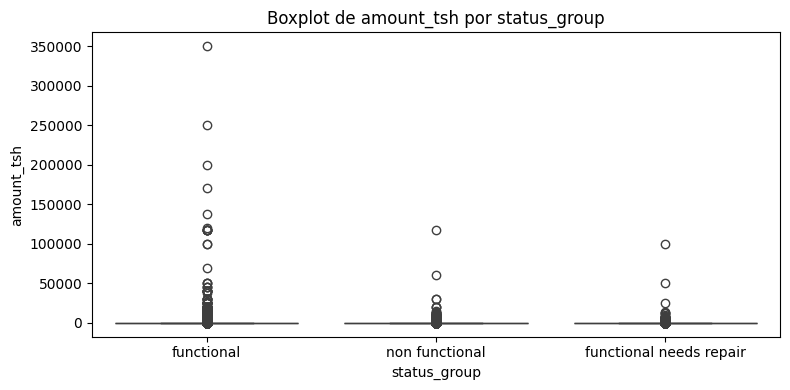


Variable numérica: gps_height
F-statistic: 395.0077 | p-valor: 0.0000
Diferencias significativas entre los grupos


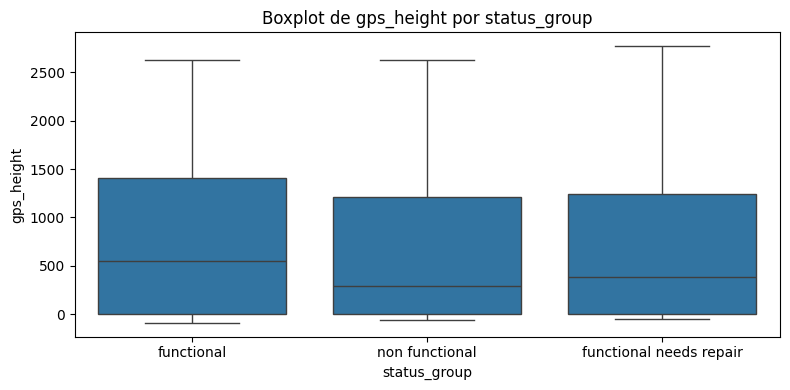


Variable numérica: longitude
F-statistic: 443.3480 | p-valor: 0.0000
Diferencias significativas entre los grupos


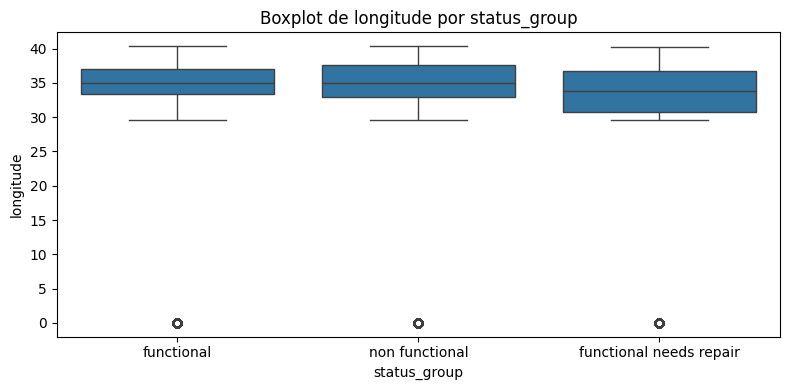


Variable numérica: latitude
F-statistic: 88.0325 | p-valor: 0.0000
Diferencias significativas entre los grupos


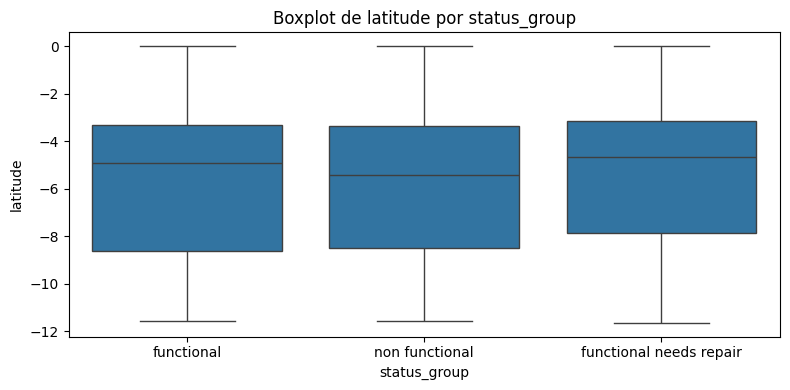


Variable numérica: num_private
F-statistic: 1.1292 | p-valor: 0.3233
No se detectan diferencias significativas


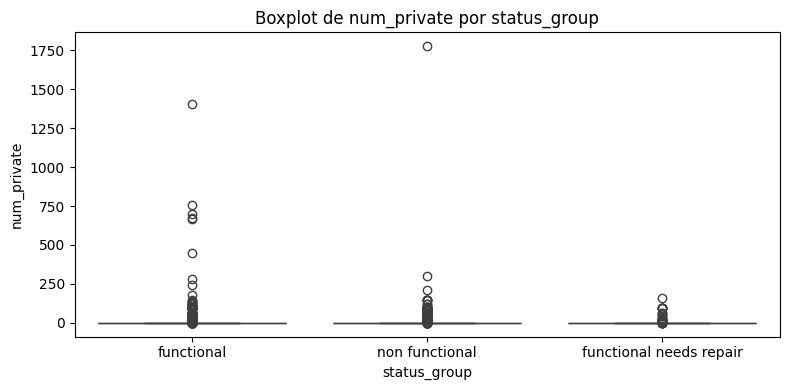


Variable numérica: region_code
F-statistic: 354.9374 | p-valor: 0.0000
Diferencias significativas entre los grupos


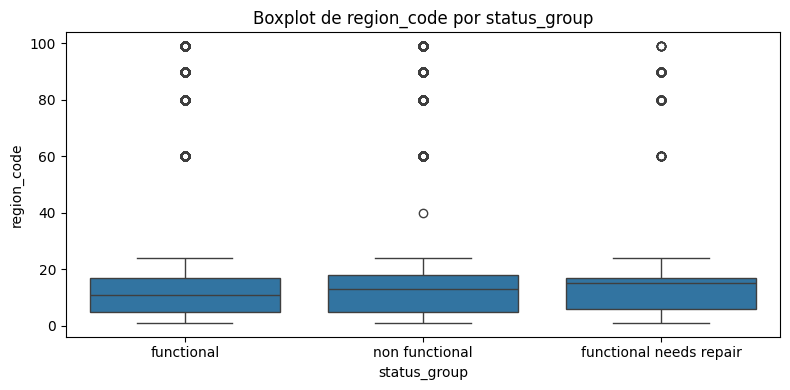


Variable numérica: district_code
F-statistic: 152.8907 | p-valor: 0.0000
Diferencias significativas entre los grupos


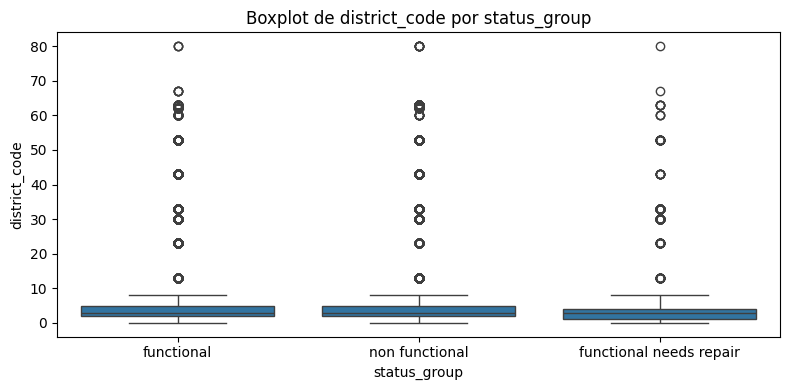


Variable numérica: population
F-statistic: 9.4911 | p-valor: 0.0001
Diferencias significativas entre los grupos


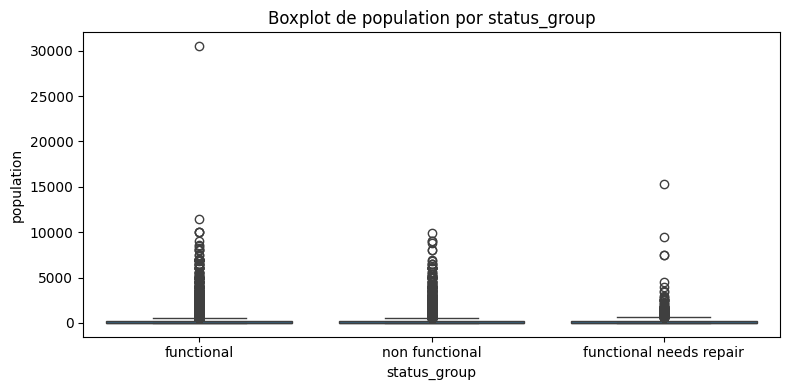


Variable numérica: construction_year
F-statistic: 96.5765 | p-valor: 0.0000
Diferencias significativas entre los grupos


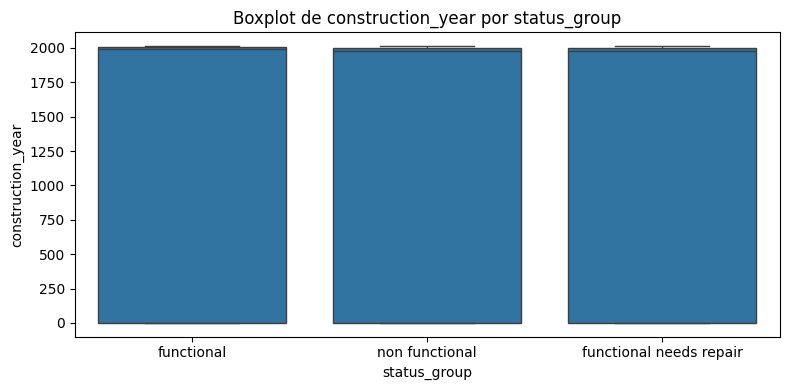


Variable numérica: date_recorded_year
F-statistic: 69.3236 | p-valor: 0.0000
Diferencias significativas entre los grupos


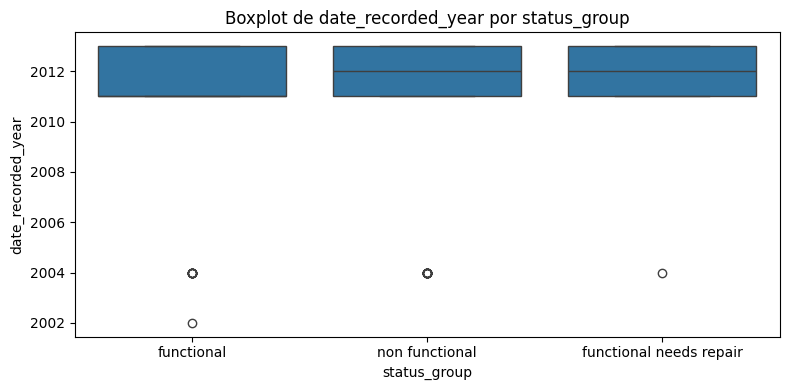


Variable numérica: date_recorded_month
F-statistic: 51.0276 | p-valor: 0.0000
Diferencias significativas entre los grupos


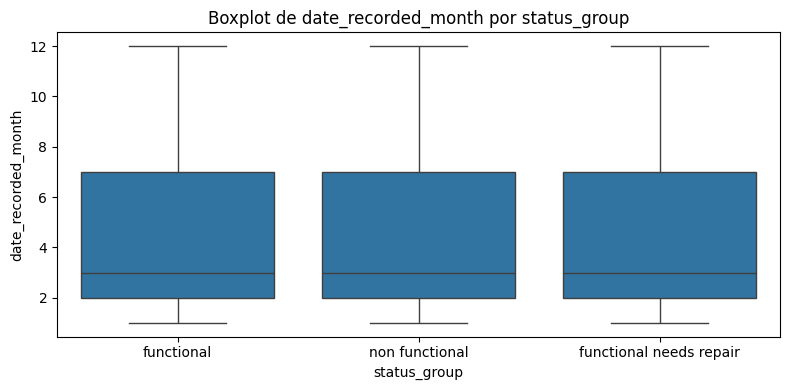


Variable numérica: date_recorded_day
F-statistic: 57.6733 | p-valor: 0.0000
Diferencias significativas entre los grupos


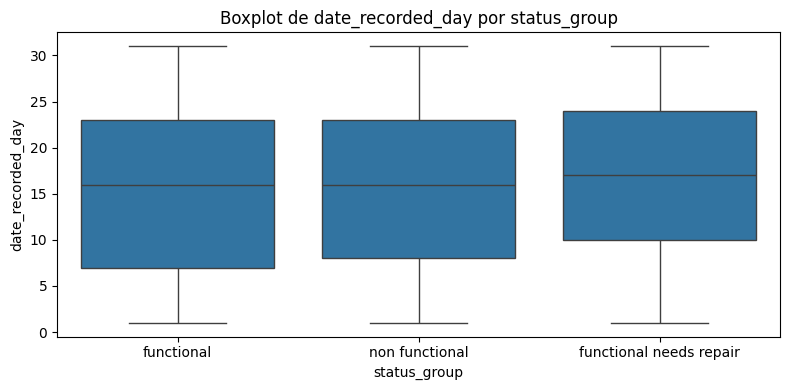

In [ ]:
# Valorar la relación de las variables continuas con la VO
for var in df_train_all.columns:
    if pd.api.types.is_numeric_dtype(df_train_all[var]):
        print(f"\nVariable numérica: {var}")

        grupos = []
        for cat in df_train_all['status_group'].unique():
            grupo = df_train_all[df_train_all['status_group'] == cat][var].dropna()
            grupos.append(grupo)

        stat, p = f_oneway(*grupos)
        print(f"F-statistic: {stat:.4f} | p-valor: {p:.4f}")
        if p < 0.05:
            print("Diferencias significativas entre los grupos")
        else:
            print("No se detectan diferencias significativas")

        plt.figure(figsize=(8, 4))
        sns.boxplot(data=df_train_all, x='status_group', y=var)
        plt.title(f'Boxplot de {var} por status_group')
        plt.tight_layout()
        plt.show()

In [ ]:
# Heatmap de correlaciones de variables
corr = df_train_all.select_dtypes(include=np.number).corr()
corr.style.background_gradient(cmap='coolwarm').format(precision=3)

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year,date_recorded_year,date_recorded_month,date_recorded_day
id,1.000,-0.005,-0.005,-0.001,0.002,-0.003,-0.003,-0.003,-0.003,-0.002,0.002,0.005,-0.000
amount_tsh,-0.005,1.000,0.077,0.022,-0.053,0.003,-0.027,-0.024,0.016,0.068,-0.005,-0.035,0.001
gps_height,-0.005,0.077,1.000,0.149,-0.036,0.007,-0.184,-0.171,0.135,0.659,0.318,-0.283,-0.005
longitude,-0.001,0.022,0.149,1.000,-0.426,0.024,0.034,0.151,0.087,0.397,0.011,-0.214,-0.035
latitude,0.002,-0.053,-0.036,-0.426,1.000,0.007,-0.221,-0.201,-0.022,-0.245,0.160,0.320,0.007
num_private,-0.003,0.003,0.007,0.024,0.007,1.000,-0.020,-0.004,0.004,0.026,-0.014,-0.022,0.007
region_code,-0.003,-0.027,-0.184,0.034,-0.221,-0.020,1.000,0.679,0.094,0.032,0.166,-0.099,0.070
district_code,-0.003,-0.024,-0.171,0.151,-0.201,-0.004,0.679,1.000,0.062,0.048,0.015,-0.108,0.051
population,-0.003,0.016,0.135,0.087,-0.022,0.004,0.094,0.062,1.000,0.261,0.132,-0.144,0.034
construction_year,-0.002,0.068,0.659,0.397,-0.245,0.026,0.032,0.048,0.261,1.000,0.355,-0.501,0.015


## **Missing no declarados**

Lo primero es que, ya conociendo la posible existencia de missing no declarados, llevarlos a Missing antes de continuar con el proceso. Se guardará en un df_train_clean que será df_train_all pero con el proceso de limpieza completo.

En el caso de muchas categorias no las revise a ver si era informacion random rellenada porque al final voy a agrupar categorias,, y si son muy minoritarias van a pasar a una nueva categoria llamada other

Ya que no tenemos una imagen de negocio para hacer preguntas, vamos a asumir lo siguiente:

- amount_tsh: Muchos cero, pero mejor tramificarla, puede ser que el pozo haya estado vacio al momento de la toma de datos y no necesariamente sea un nulo
- gps_height: La altitud del pozo, no tiene sentido un pozo en numeros 0 o negativos ya que Tanzania está topográficamente elevada, con altitudes promedio de 1,000 metros, esto si tomamos 0 como altitud a ras con el nivel del mar
- longitude y latitude: No hay 0 en Tanzania
- wpt_name: Tiene palabras de una letra, lo cual es raro
- Subvillage: Tiene letras como a y b solas, que una variable como subvillage (una ubicación geográfica) tenga categorías como 'a' o 'b' no tiene sentido real y puede ser faltantes mal imputados, ya que es una variable importante, vamos a hacer que todos los que tengan una sola letra se imputen a Nan
- region_code: Dado que tenemos 21 regiones en region, y region_code tiene valores consecutivos, podriamos asumir que mas de 21 seria considerado valores mal codificados. Por ejemplo 40, podria ser un 4, ya que solo existen valores raros con el cero agregado y son muy puntuales. Por otra parte no vay valores más alla del 21 que sean distintos a terminados en 0 como (Ej: 53, 87), lo que refuerza mi teoria. Los valores 24 y 99 pasaran a NaN.
- district_code: No se va a imputar, ya que los valores se ven distribuidos, aunque en pequennas cantidades, pero a lo largo de la distribucion
- population: Un pozo sin personas alrededor no tiene utilidad, por tanto no tiene logica, los valores 0 es probable que sean valores mal codificados, que sería conveniente ver si se pueden rellenar teniendo en cuenta otras variables, seria conveniente hacer otra variable con dos categorias, una para los datos faltantes y otra para los conocidos, mantener tambien la variable original aunque no aporte
- scheme_name: Posee letras unicas, como en casos anteriores
- construction_year: Llevar 0 a Nan
- management, management_group, payment, payment_type, source : tienen una categoría llamada unknown que podría pasarse a Nan e imputarla, tambien tiene llamada others, otra opcion sería unirlas. Probaré las dos.
- water_quality, quality_group, quantity, quantity_group, source_class: Tienen categorias llamadas unknown pero no others, estas habria que valorar si imputarlas o mantenerlas como categoria desconocida

In [ ]:
# Crear df_train_clean que será el futuro df con los nulos declarados y con los posibles outliers tratados
df_train_clean = df_train_all.copy()
df_train_clean.head()

,id,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,date_recorded_year,date_recorded_month,date_recorded_day
0,69572,6000.0,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,2011,3,14
1,8776,0.0,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,2013,3,6
2,34310,25.0,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional,2013,2,25
3,67743,0.0,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional,2013,1,28
4,19728,0.0,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,2011,7,13


In [ ]:
# Ver las filas mas afectadas antes de pasar a nan
top_missing_rows_before = df_train_all.loc[:, ['id']].assign(
    missing=df_train_all.isnull().sum(axis=1),
    missing_prop=df_train_all.isnull().mean(axis=1)
).sort_values(by='missing', ascending=False).head(10)
top_missing_rows_before

,id,missing,missing_prop
11968,19795,6,0.139535
21690,71282,6,0.139535
36032,66687,6,0.139535
27798,65087,6,0.139535
13754,52485,6,0.139535
59344,6450,6,0.139535
12776,73137,5,0.116279
54150,11860,5,0.116279
54155,43701,5,0.116279
36136,11580,5,0.116279


In [ ]:
# Convertir los valores 0 a NaN en la columna 'amount_tsh'
#df['amount_tsh'] = df['amount_tsh'].replace(0, np.nan)

In [ ]:
# Variable: gps_height
df_train_clean.loc[df_train_clean['gps_height'] <= 0, 'gps_height'] = np.nan
print((df_train_clean['gps_height'] <= 0).sum())
print(df_train_clean['gps_height'].isna().sum())

0
21934


In [ ]:
# Variable: longitude
df_train_clean.loc[df_train_clean['longitude'] == 0, 'longitude'] = np.nan
print((df_train_clean['longitude'] == 0).sum())
print(df_train_clean['longitude'].isna().sum())

0
1812


In [ ]:
# Variable: latitude
df_train_clean.loc[(df_train_clean['latitude'] > -1), 'latitude'] = np.nan
print((df_train_clean['latitude'] == 0).sum())
print(df_train_clean['latitude'].isna().sum())

0
1819


In [ ]:
# Variable: wpt_name
df_train_clean.loc[df_train_clean['wpt_name'].str.len() <= 1, 'wpt_name'] = np.nan
print(df_train_clean['wpt_name'].isna().sum())

11


In [ ]:
# Variable: subvillage
df_train_clean.loc[df_train_clean['subvillage'].str.len() <= 1, 'subvillage'] = np.nan
print(df_train_clean['subvillage'].isna().sum())

1041


In [ ]:
# Variable: Region_code
def clean_region_code(code):
    if code > 21:
        if code % 10 == 0:
            return int(str(code)[0])
        else:
            return np.nan
    else:
        return code

df_train_clean['region_code'] = df_train_clean['region_code'].apply(clean_region_code)
print(df_train_clean['region_code'].isna().sum())

749


In [ ]:
#Variable: population
df_train_clean.loc[df_train_clean['population'] == 0, 'population'] = np.nan
print((df_train_clean['population'] == 0).sum())
print(df_train_clean['population'].isna().sum())

0
21381


In [ ]:
#df_train_clean[df_train_clean['population'] == 0].head()

In [ ]:
#Variable: scheme_name
df_train_clean.loc[df_train_clean['scheme_name'].str.len() <= 1, 'scheme_name'] = np.nan
print(df_train_clean['scheme_name'].isna().sum())

30929


In [ ]:
# Variable: construction_year
df_train_clean.loc[df_train_clean['construction_year'] == 0, 'construction_year'] = np.nan
print((df_train_clean['construction_year'] == 0).sum())
print(df_train_clean['construction_year'].isna().sum())

0
20709


In [ ]:
# Variables: management, management_group, payment, payment_type, source
for var in ['management', 'management_group', 'payment', 'payment_type', 'source']:
    print(f'{var}')
    # Modificar 'unknown' como NaN y guardarla en _nan
    df_train_clean[f'{var}_nan'] = df_train_clean[var].replace('unknown', np.nan)
    print(f"Nulos en {var}_nan: {df_train_clean[f'{var}_nan'].isna().sum()}")

    # Modificar 'unknown' como 'others' y guardarla en _mix
    df_train_clean[f'{var}_mix'] = df_train_clean[var].replace('unknown', 'others')
    unknown_remaining = (df_train_clean[f'{var}_mix'] == 'unknown').sum()
    print(f"Cantidad de 'unknown' que quedan en {var}_mix: {unknown_remaining}")

management
Nulos en management_nan: 561
Cantidad de 'unknown' que quedan en management_mix: 0
management_group
Nulos en management_group_nan: 561
Cantidad de 'unknown' que quedan en management_group_mix: 0
payment
Nulos en payment_nan: 8157
Cantidad de 'unknown' que quedan en payment_mix: 0
payment_type
Nulos en payment_type_nan: 8157
Cantidad de 'unknown' que quedan en payment_type_mix: 0
source
Nulos en source_nan: 66
Cantidad de 'unknown' que quedan en source_mix: 0


In [ ]:
# Variables: water_quality, quality_group, quantity, quantity_group, source_class
for var in ['water_quality', 'quality_group', 'quantity', 'quantity_group', 'source_class']:
    #Variables llevando unknown a nan
    df_train_clean[f'{var}_nan'] = df_train_clean[var].replace('unknown', np.nan)
    print(f"Nulos en {var}_nan: {df_train_clean[f'{var}_nan'].isna().sum()}")

Nulos en water_quality_nan: 1876
Nulos en quality_group_nan: 1876
Nulos en quantity_nan: 789
Nulos en quantity_group_nan: 789
Nulos en source_class_nan: 278


In [ ]:
# Cantidad de nulos por variable
missing_summary = pd.DataFrame({
    'missing_count_clean': df_train_clean.isnull().sum(),
    'missing_pct_clean': df_train_clean.isnull().mean()
}).sort_values(by='missing_count_clean', ascending=False)

missing_summary

,missing_count_clean,missing_pct_clean
scheme_name,30929,0.520690
gps_height,21934,0.369259
population,21381,0.359949
construction_year,20709,0.348636
payment_type_nan,8157,0.137323
payment_nan,8157,0.137323
scheme_management,3878,0.065286
installer,3655,0.061532
funder,3637,0.061229
public_meeting,3334,0.056128


In [ ]:
# Ver las filas mas afectadas luego de pasar a nan
top_missing_rows_after = df_train_clean.loc[:, ['id']].assign(
    missing=df_train_clean.isnull().sum(axis=1),
    missing_prop=df_train_clean.isnull().mean(axis=1)
).sort_values(by='missing', ascending=False).head(10)
top_missing_rows_after

,id,missing,missing_prop
54290,58037,20,0.344828
25463,9846,18,0.310345
46422,67675,18,0.310345
34337,9634,18,0.310345
17344,21640,17,0.293103
31546,46833,17,0.293103
11968,19795,17,0.293103
41321,6454,17,0.293103
21690,71282,17,0.293103
27798,65087,17,0.293103


Se siguieron las estrategias planteadas al inicio. Como se puede observar, ha habido un aumento considerable de los nulos por variable y fila, siendo en este ultimo el caso de que las filas mas afcetadas anteriormente no son las mas afectadas ahora

### Identificar si existen patrones de datos faltantes

Perdido al azar (MAR): la probabilidad de que cualquier punto de datos sea MAR es la misma dentro de los grupos de datos observados ; esto es mucho más realista que MCAR
Si la probabilidad de que se pierdan datos es diferente para distintos grupos, pero igualmente probable dentro de un grupo, entonces esos datos faltan al azar. Es una especie de híbrido entre falta por una razón y falta completamente al azar.
Por ejemplo, varios estudios científicos han demostrado que a las personas no les gusta informar su peso, especialmente cuando tienen un índice de masa corporal (IMC) fuera del rango “normal”. Este es un ejemplo de datos faltantes al azar porque podemos suponer que algunos grupos no informan su peso por alguna razón, pero que cualquier persona dentro de ese grupo (es decir, alguien con un IMC no “normal”) tiene la misma probabilidad de no informar su peso.


<Axes: >

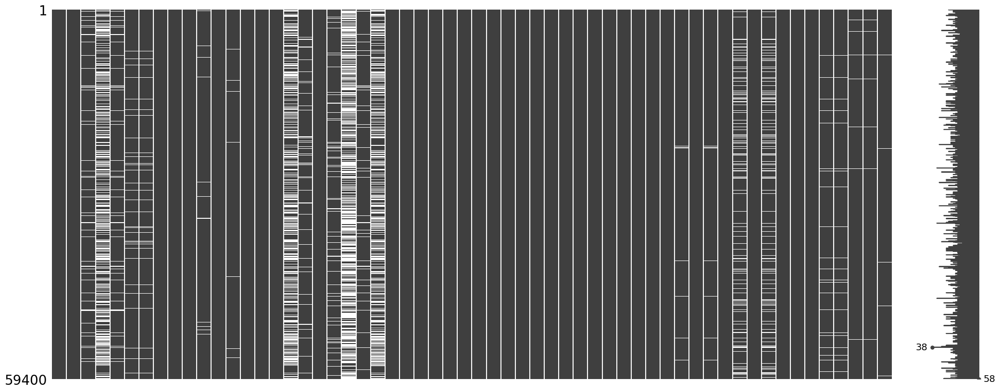

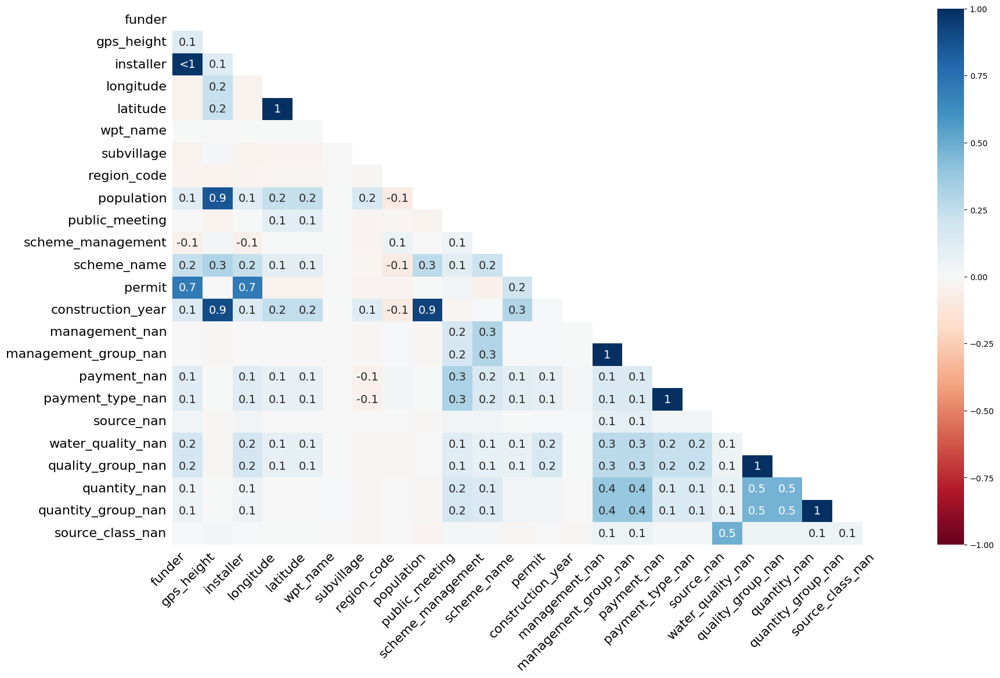

In [ ]:
# Observar mejor e iterar para ver coexistencia y patrones de missings
msno.matrix(df_train_clean)
msno.heatmap(df_train_clean)

<Figure size 1200x800 with 0 Axes>

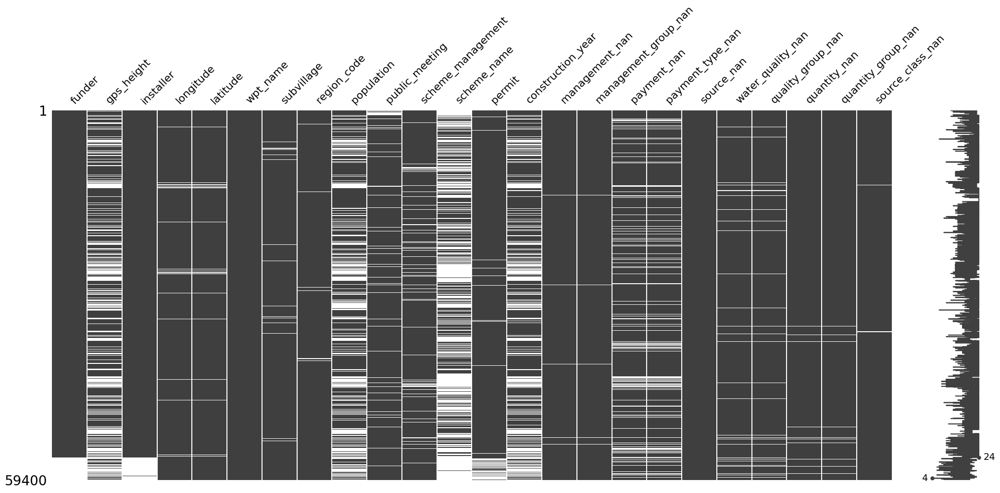

In [ ]:
# Patrones en funder, installer, permit ()solo las que tienen valores nulos para mejor visibilidad

cols_with_na = df_train_clean.columns[df_train_clean.isnull().any()]
plt.figure(figsize=(12, 8))
msno.matrix(df_train_clean[cols_with_na].sort_values(by='funder'))
#msno.matrix(df_train_clean[cols_with_na].sort_values(by='funder'))
#msno.matrix(df_train_clean[cols_with_na].sort_values(by='scheme_name'))
#msno.matrix(df_train_clean[cols_with_na].sort_values(by='construction_year'))
#msno.matrix(df_train_clean[cols_with_na].sort_values(by='longitude'))
#msno.matrix(df_train_clean[cols_with_na].sort_values(by='management_nan'))
#msno.matrix(df_train_clean[cols_with_na].sort_values(by='source_nan'))
#msno.matrix(df_train_clean[cols_with_na](by='water_quality_nan'))
plt.show()

Analizando las tendencias en los patrones de missing he encontrado los siguientes (solo se muestran las variables con missing, no las originales sin missings):

- Existe una alta probabilidad conjunta de ausencia entre las variables funder, installer y permit.
- Existe una probabilidad no tan alta de que si falta scheme_name o scheme_management, el otro lo falte tambien
- construction_year, gps_height y population muestran una correlación fuerte.
- longitude,latitude: Es esperable si ambas son coordenadas geográficas faltantes simultáneamente.
- management_nan, management_group_nan , esperada por la relación jerárquica entre ambas.A su vez media con quantity_group_nan y quantity_nan
- source_nan con source_class_nan:  correlación fuerte, lo cual sugiere que ambas representan facetas relacionadas del origen del agua y fallan juntas.
- water_quality_nan muestra correlación alta con quality_group_nan, y ambas a su vez con quantity_nan y quantity_group_nan

#**Gestionar outliers**

   Se identifican valores atípicos. Según su impacto en la variable objetivo, pueden ser eliminados, transformados, imputados o conservados si aportan información relevante. Esto permite reducir el ruido y evitar resultados sesgados.

In [ ]:
# Asimetría de variables
df_train_clean_outlier = df_train_clean.copy() # Crear df sin outliers (outliers tratados)
id_train = df_train_clean_outlier['id'].copy()
# Eliminar la columna 'id' del DataFrame
df_train_clean_outlier.drop(columns=['id'], inplace=True)
df_train_clean_outlier.head()

,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,date_recorded_year,date_recorded_month,date_recorded_day,management_nan,management_mix,management_group_nan,management_group_mix,payment_nan,payment_mix,payment_type_nan,payment_type_mix,source_nan,source_mix,water_quality_nan,quality_group_nan,quantity_nan,quantity_group_nan,source_class_nan
0,6000.0,Roman,1390.0,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11.0,5,Ludewa,Mundindi,109.0,True,GeoData Consultants Ltd,VWC,Roman,False,1999.0,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,2011,3,14,vwc,vwc,user-group,user-group,pay annually,pay annually,annually,annually,spring,spring,soft,good,enough,enough,groundwater
1,0.0,Grumeti,1399.0,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20.0,2,Serengeti,Natta,280.0,NaN,GeoData Consultants Ltd,Other,NaN,True,2010.0,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,2013,3,6,wug,wug,user-group,user-group,never pay,never pay,never pay,never pay,rainwater harvesting,rainwater harvesting,soft,good,insufficient,insufficient,surface
2,25.0,Lottery Club,686.0,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21.0,4,Simanjiro,Ngorika,250.0,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009.0,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional,2013,2,25,vwc,vwc,user-group,user-group,pay per bucket,pay per bucket,per bucket,per bucket,dam,dam,soft,good,enough,enough,surface
3,0.0,Unicef,263.0,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,9.0,63,Nanyumbu,Nanyumbu,58.0,True,GeoData Consultants Ltd,VWC,NaN,True,1986.0,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional,2013,1,28,vwc,vwc,user-group,user-group,never pay,never pay,never pay,never pay,machine dbh,machine dbh,soft,good,dry,dry,groundwater
4,0.0,Action In A,NaN,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18.0,1,Karagwe,Nyakasimbi,NaN,True,GeoData Consultants Ltd,NaN,NaN,True,NaN,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,2011,7,13,other,other,other,other,never pay,never pay,never pay,never pay,rainwater harvesting,rainwater harvesting,soft,good,seasonal,seasonal,surface


In [ ]:
df_train_clean_outlier.select_dtypes(include=np.number).skew()

,0
amount_tsh,57.807800
gps_height,-0.229242
longitude,-0.134811
latitude,-0.252417
num_private,91.933750
region_code,-0.074416
district_code,3.962045
population,10.988913
construction_year,-0.731474
date_recorded_year,-0.150980


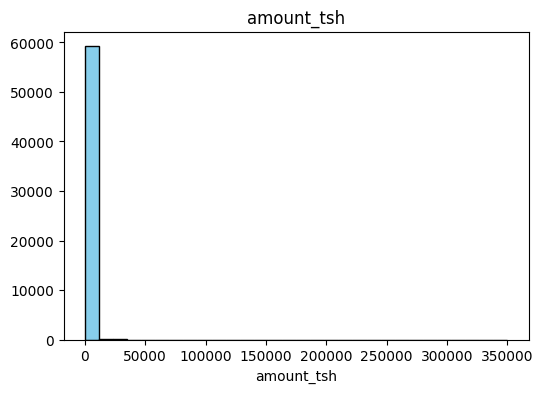

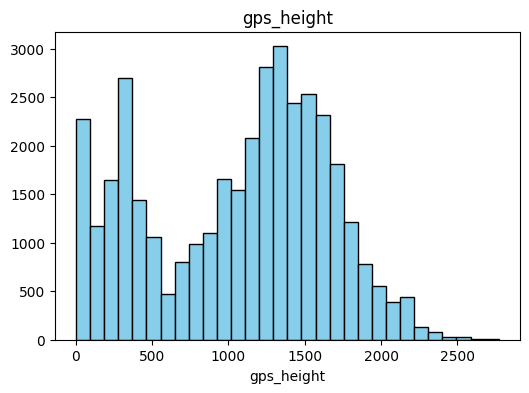

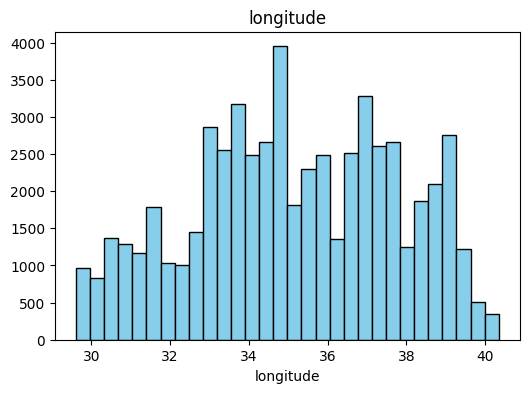

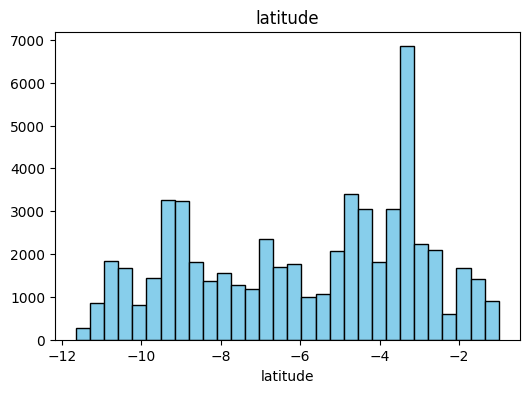

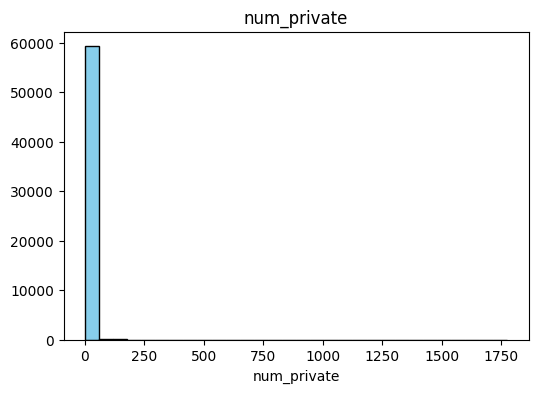

...

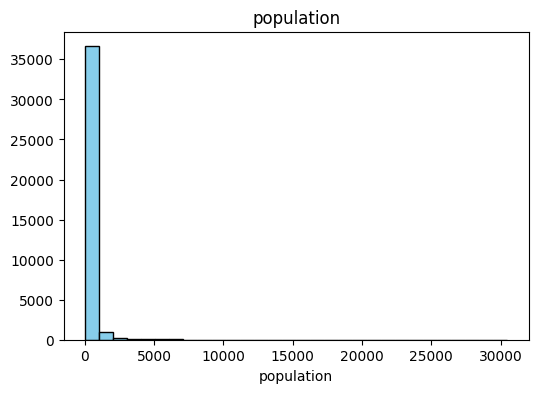

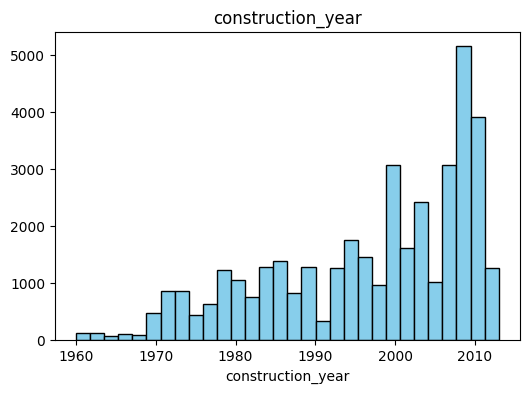

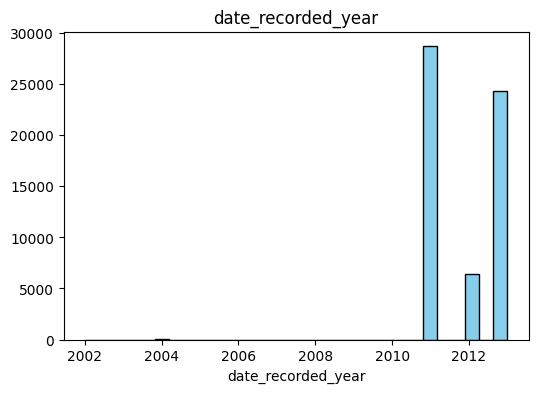

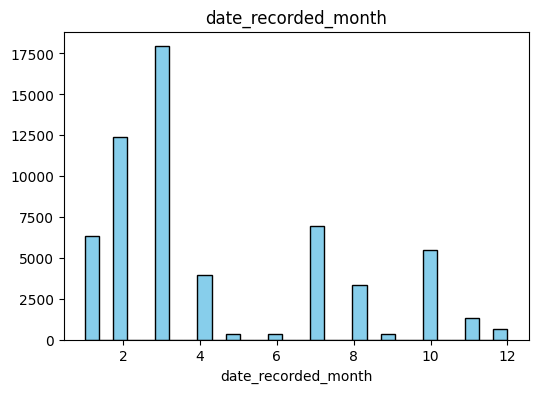

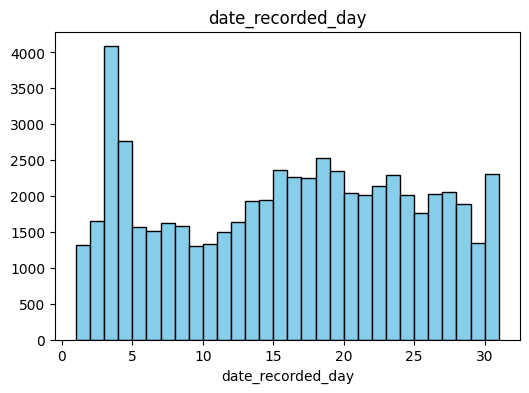

In [ ]:
# Pintar distribuciones resultantes de las variables numéricas
for col in df_train_clean_outlier.select_dtypes(include='number').columns:
    plt.figure(figsize=(6, 4))
    plt.hist(df_train_clean[col].dropna(), bins=30, color='skyblue', edgecolor='black')
    plt.title(f'{col}')
    plt.xlabel(col)
    plt.show()

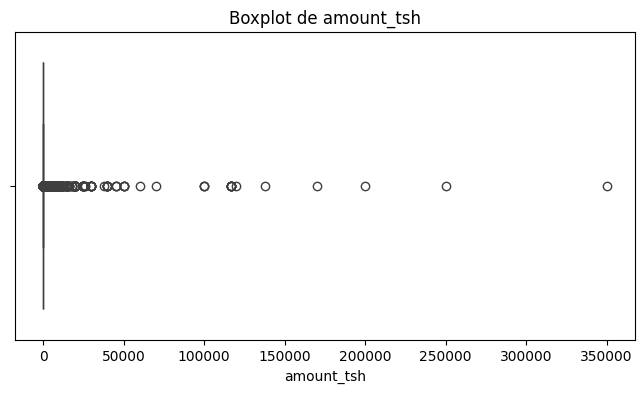

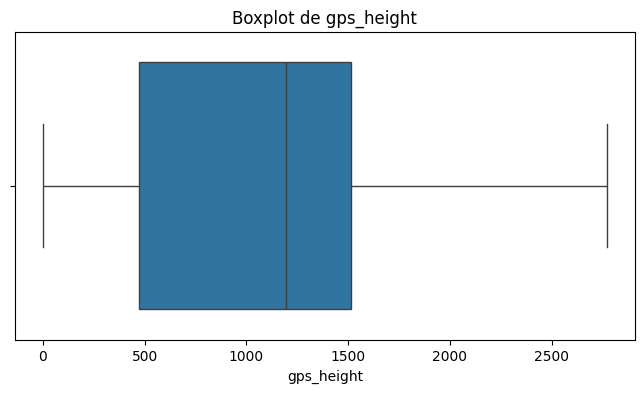

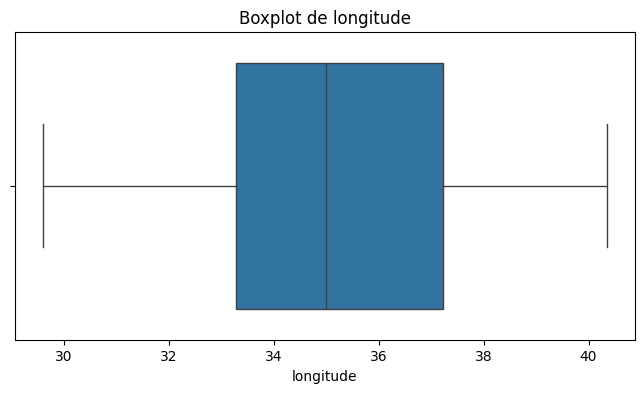

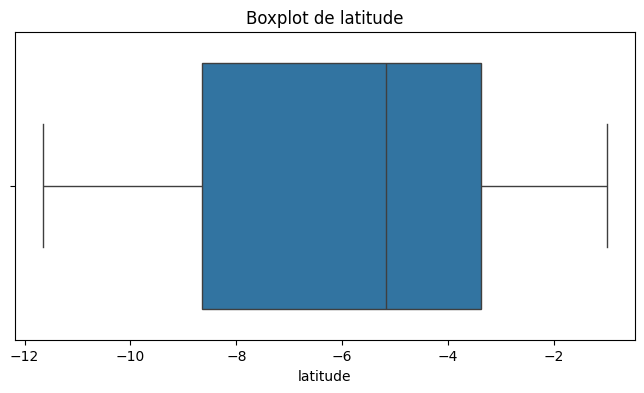

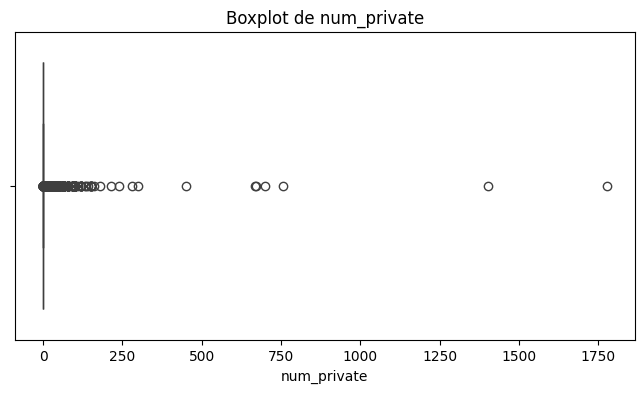

...

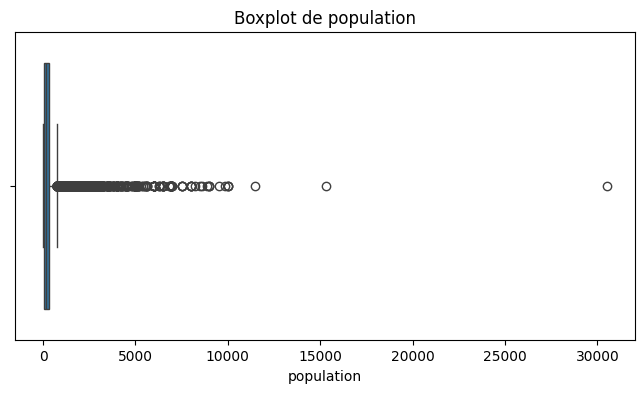

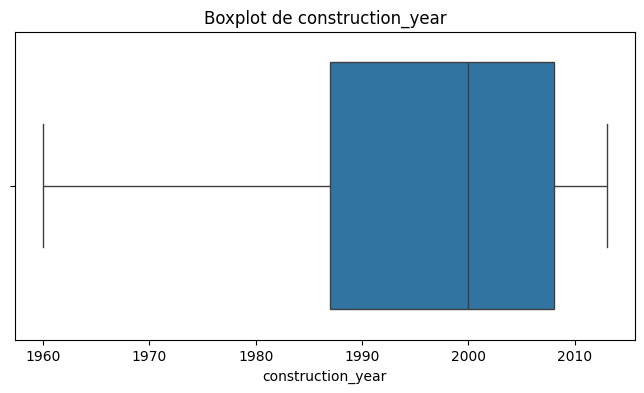

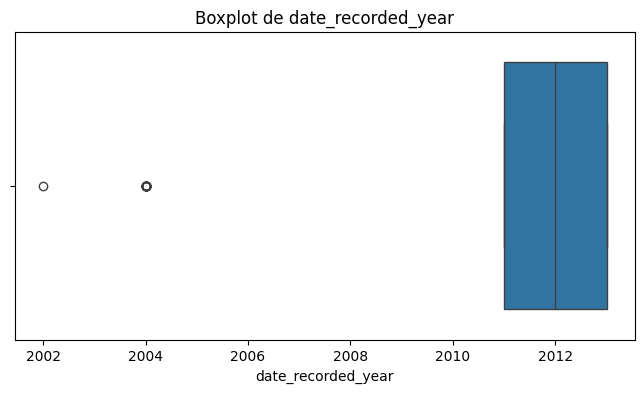

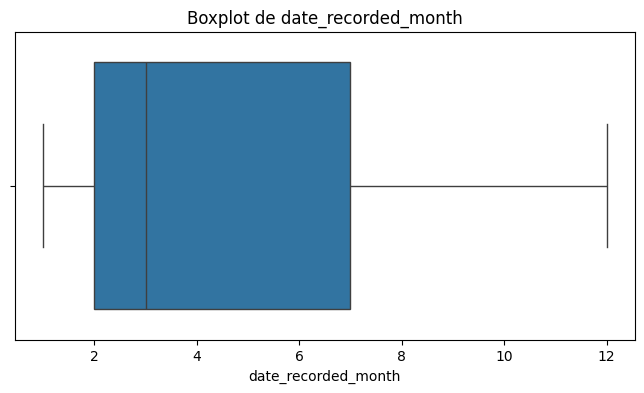

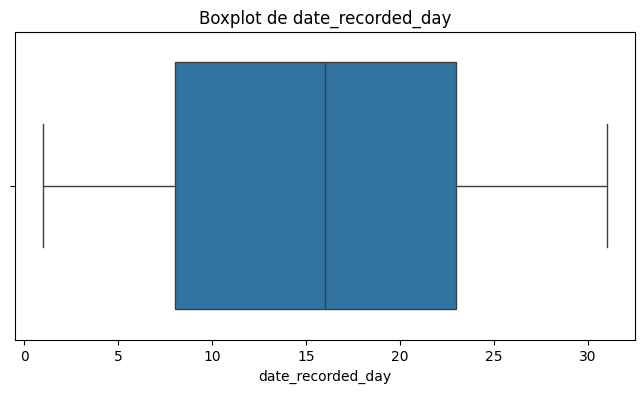

In [ ]:
for col in df_train_clean_outlier.select_dtypes(include='number').columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df_train_clean[col])
    plt.title(f'Boxplot de {col}')
    plt.show()

Para las variables amount_tsh, district_code, num_private y population, se identificarán los registros con valores extremos (outliers) y se aplicará la técnica de Winsorization en lugar de eliminarlos. Este método reemplazará los outliers más extremos (por ejemplo, aquellos por debajo del percentil 1% o por encima del 99%) con los valores límite correspondientes, manteniendo así la estructura de los datos sin perder observaciones.

In [ ]:
# Aplica winsorización a una serie de pandas basada en z-score
def winsor_zscore(series, threshold=3, lower_pct=0.01, upper_pct=0.99):
    # Calcular z-score
    z = np.abs(stats.zscore(series.dropna()))
    outliers_idx = series.dropna().index[z > threshold]
    print(np.where(z > 3))
    print(f"Se detectaron {len(outliers_idx)} outliers (z > {threshold})")

    # Winsorizar
    s_winsor = series.copy()
    lower = series.quantile(lower_pct)
    upper = series.quantile(upper_pct)
    s_winsor = np.clip(s_winsor, lower, upper)

    # Visualización después
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=s_winsor)
    plt.title(f'Boxplot DESPUÉS de winsorizar: {series.name}')
    plt.show()

    return s_winsor

(array([  194,   543,   559,   993,  1342,  1386,  1874,  2532,  2559,
        2654,  2857,  2866,  3033,  3054,  3228,  3245,  3330,  3585,
        4036,  4797,  5345,  5451,  5526,  5558,  5901,  6591,  6774,
        6954,  7364,  7747,  7756,  8156,  8345,  8463,  8464,  8524,
        9580,  9917,  9961, 10101, 10333, 10615, 10778, 10812, 10934,
       10939, 11112, 11349, 11452, 11496, 11794, 11796, 12114, 12250,
       12585, 12670, 12793, 12895, 13031, 13095, 13333, 13421, 13953,
       14098, 14823, 15285, 15363, 15367, 15396, 15587, 15913, 15989,
       16090, 16317, 17341, 17410, 17490, 17605, 17715, 17794, 18166,
       18538, 19384, 19561, 19946, 20312, 20500, 20692, 21052, 21567,
       22191, 22395, 22398, 22456, 22487, 22817, 23049, 23087, 23247,
       23252, 23446, 24257, 24520, 24675, 24956, 25065, 25542, 26014,
       26130, 27039, 27427, 27536, 27998, 28327, 28580, 29764, 30241,
       30372, 30423, 30955, 31013, 31143, 31906, 31974, 31976, 32332,
       33153, 33168

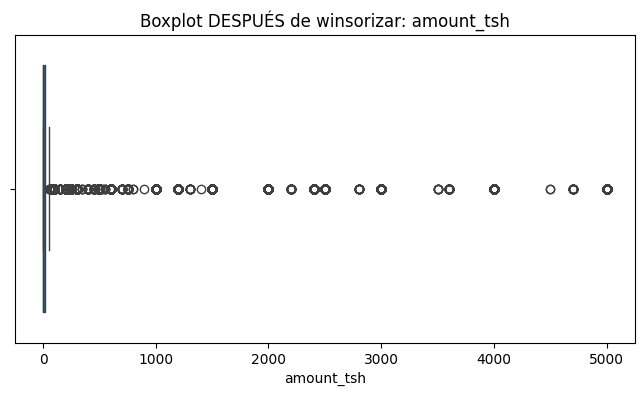

In [ ]:
df_train_clean_outlier['amount_tsh'] = winsor_zscore(df_train_clean_outlier['amount_tsh'])

(array([  469,   519,   727,  1416,  1752,  2065,  2432,  2535,  2713,
        2840,  3092,  3254,  3292,  3383,  3591,  3795,  4244,  5177,
        5448,  5752,  5926,  6039,  6471,  6668,  6828,  6979,  6990,
        7058,  7196,  7279,  7898,  7953,  8046,  8059,  8199,  8940,
        9040,  9853,  9992, 10301, 10509, 11290, 11610, 11703, 12036,
       12216, 13089, 13188, 14816, 15144, 15620, 16704, 16840, 16936,
       17337, 17605, 17828, 17847, 17849, 17992, 18106, 18195, 18363,
       18456, 18913, 19039, 19480, 19561, 19765, 19778, 20176, 20208,
       20319, 20393, 20485, 20677, 20715, 20810, 21005, 21088, 21518,
       21667, 21710, 23346, 23475, 23544, 23823, 23911, 24092, 24112,
       24471, 24585, 24592, 24657, 24970, 25175, 25316, 25649, 25829,
       25895, 26116, 26634, 26904, 27655, 28767, 29571, 29696, 30270,
       30375, 30514, 30940, 31297, 31440, 31458, 31719, 31991, 32419,
       32463, 32998, 33218, 33539, 33553, 33914, 34803, 35204, 35530,
       35839, 35868

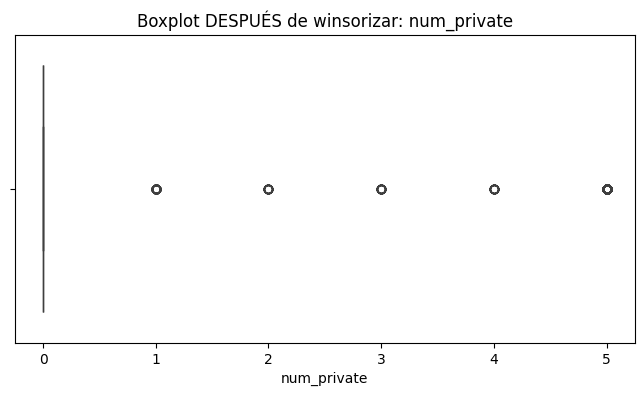

In [ ]:
df_train_clean_outlier['num_private'] = winsor_zscore(df_train_clean_outlier['num_private'])

(array([    3,    10,    34, ..., 59254, 59323, 59383]),)
Se detectaron 1635 outliers (z > 3)


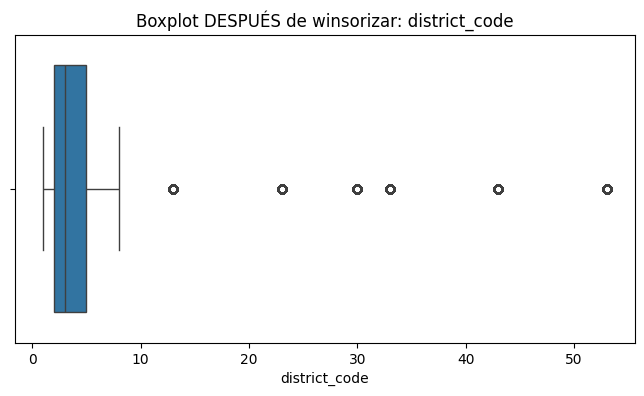

In [ ]:
df_train_clean_outlier['district_code'] = winsor_zscore(df_train_clean_outlier['district_code'])

(array([  103,   170,   277,   297,   302,   360,   406,   568,   614,
         666,   674,   775,   964,  1162,  1167,  1261,  1307,  1478,
        1579,  1599,  1608,  1685,  1733,  1754,  1800,  1809,  1895,
        1958,  2003,  2102,  2135,  2171,  2184,  2186,  2196,  2203,
        2269,  2346,  2349,  2363,  2464,  2482,  2536,  2567,  2603,
        2684,  2704,  2721,  2735,  2783,  2842,  2863,  2944,  2980,
        3037,  3083,  3161,  3177,  3282,  3325,  3386,  3500,  3511,
        3530,  3531,  3642,  3660,  3682,  3946,  3973,  3996,  4014,
        4174,  4181,  4246,  4354,  4368,  4724,  4756,  4940,  4966,
        5013,  5060,  5086,  5160,  5175,  5183,  5272,  5296,  5322,
        5343,  5487,  5634,  5651,  5695,  5789,  5797,  5869,  5960,
        5964,  6206,  6208,  6241,  6245,  6389,  6717,  6799,  6847,
        6857,  6872,  6903,  6914,  6954,  7015,  7026,  7028,  7035,
        7140,  7242,  7308,  7326,  7332,  7340,  7352,  7360,  7520,
        7559,  7753

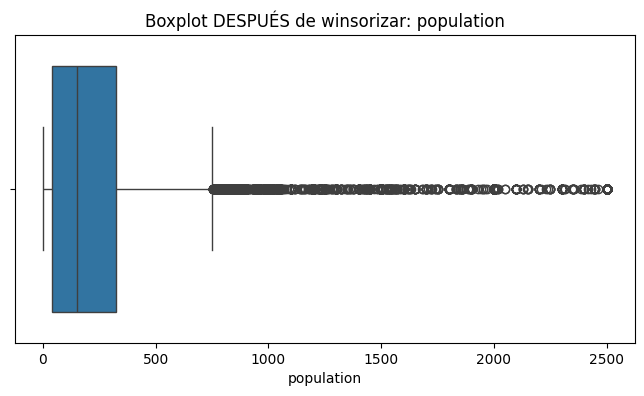

In [ ]:
df_train_clean_outlier['population'] = winsor_zscore(df_train_clean_outlier['population'])

No parecen haber mejorado nada las variables amount_tsh y num_private, son las variaboes menos representativas segun cramer y siguen una distribucion en extremo sesgada, con exceso de 0. Con population sucede que hay poblaciones regstradas incluso de 1, que puede ser poco probable que existan realmente, pero no tengo contexto para eliminarlas de momento

## **Gestionar Missings**
Pensé utilizar en principio una imputacion de knn para todos los valores faltantes, ya que se detectaron ciertos patrones en los valores perdidos y esta metodología resultaba más adecuada ya que me permite tener en cuenta varios registros a la vez para imputar y guardar el imputador en un pickle para poder utilizarlo mas adelante. El proceso me tardaba por ejecucion alrededor de 10 minutos

Al final me decanté por utilizar mediana para variables continuas y moda para variables categóricas, la imputación simple resulta más ágil y me ahorra tiempo aunque puede que deje de tener en cuenta. No descarto probar con utilizar knn una vez obtenido el modelo ganador para ver si mejora

In [ ]:
# Imputar por knn había sido mi primera opción, pero demoraba mucho en ejecutar y decidí buscar mayor agilidad
def imputar_knn(df, n_neighbors=5, imputer_path='knn_imputer.pkl', encoders_path='label_encoders.pkl'):

    # Identificar variables categóricas
    cat_cols = df.select_dtypes(exclude=np.number).columns

    label_encoders = {}

    # Codificar variables categóricas
    for col in cat_cols:
        le = LabelEncoder()
        mask = df[col].notna()
        df.loc[mask, col] = le.fit_transform(df.loc[mask, col].astype(str))
        label_encoders[col] = le

    # Convertir todo a float para KNNImputer
    df_encoded = df.astype(float)

    # Crear y ajustar el KNNImputer
    knn_imputer = KNNImputer(n_neighbors=n_neighbors)
    df_imputed = pd.DataFrame(knn_imputer.fit_transform(df_encoded), columns=df_encoded.columns)

    # Guardar imputador y encoders
    with open(imputer_path, 'wb') as f:
        pickle.dump(knn_imputer, f)

    with open(encoders_path, 'wb') as f:
        pickle.dump(label_encoders, f)

    # Decodificar variables categóricas
    for col in cat_cols:
        le = label_encoders[col]
        df_imputed[col] = le.inverse_transform(df_imputed[col].round().astype(int))

    return df_imputed

In [ ]:
#df_train_clean_outliers_knn = df_train_clean_outlier.copy() # Copiar el df_train limpio y con un tratamiento de outliers
#cols_to_drop = [col for col in df_train_clean_outliers_knn.columns if col.endswith('_nan') or col.endswith('_mix')]
#df_train_clean_outliers_knn.drop(columns=cols_to_drop, inplace=True)
#df_train_clean_outliers_knn = imputar_knn(df_train_clean_outliers_knn)
#df_train_clean_outliers_knn.info()

---

# **Feature Engineering y Modelado**

En esta etapa se transforman, crean y seleccionan variables con el objetivo de mejorar el rendimiento de los modelos. Se busca representar los datos de una forma que permita al modelo identificar patrones relevantes y generalizables. Las principales acciones a implementar son:

1. **Eliminar variables irrelevantes o redundantes**  
   Se eliminan variables que no aportan valor predictivo o duplican información presente en otras.

2. **Transformar variables**  
   Se analiza el tipo de variable, su cardinalidad y distribución. Se agrupan categorías si es necesario y se codifican de forma adecuada para evitar una alta dimensionalidad que dificulte el entrenamiento del modelo o se tramifica

3. **Crear nuevas variables**  
   A partir de las existentes, se generan nuevas características relevantes que resuman o complementen la información original, con el objetivo de mejorar la capacidad predictiva y reducir la complejidad.
4. **Probar métodos de mejora**
   Se probarán modelos de Ensemble y además, tuneo de hiperparámetros del modelo ganador. Por otra parte, en otro archivo, probaré el df que mejores métricas me de con Pycaret

## **Modelo 1**
Modelo más básico:
- RandomForestClassifier
- Hacer oversampling de target
- Utilizar LabelEncoder las categóricas de df_train_clean_outliers_knn
- Sin hacer Feature Engineering
- No tener en cuenta variables con sufijo _nan o _mix
- OverSampling

In [ ]:
# Crear df para modelo y agregarle la target
df_train_model1 = df_train_clean_outlier.copy()
df_train_model1['status_group'] = df_train_clean['status_group']

In [ ]:
# Eliminar columnas que terminan en '_nan' o '_mix'
cols_to_drop = [col for col in df_train_model1.columns if col.endswith('_nan') or col.endswith('_mix')]
df_train_model1 = df_train_model1.drop(columns=cols_to_drop)

In [ ]:
# Utilizar una imputación de momento sencilla, variables continuas con la mediana y variables categóricas con la moda
# Separar columnas numéricas y categóricas
num_cols = df_train_model1.select_dtypes(include=['int64', 'float64']).columns
cat_cols = df_train_model1.select_dtypes(include=['object', 'category']).columns
cat_cols = [col for col in cat_cols if col != 'status_group']

# Imputar numericas con mediana
imputer_num = SimpleImputer(strategy='median')
df_train_model1[num_cols] = imputer_num.fit_transform(df_train_model1[num_cols])

# IMputar categoricas con moda
imputer_cat = SimpleImputer(strategy='most_frequent')
df_train_model1[cat_cols] = imputer_cat.fit_transform(df_train_model1[cat_cols])

df_train_model1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 42 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             59400 non-null  float64
 1   funder                 59400 non-null  object 
 2   gps_height             59400 non-null  float64
 3   installer              59400 non-null  object 
 4   longitude              59400 non-null  float64
 5   latitude               59400 non-null  float64
 6   wpt_name               59400 non-null  object 
 7   num_private            59400 non-null  float64
 8   basin                  59400 non-null  object 
 9   subvillage             59400 non-null  object 
 10  region                 59400 non-null  object 
 11  region_code            59400 non-null  float64
 12  district_code          59400 non-null  float64
 13  lga                    59400 non-null  object 
 14  ward                   59400 non-null  object 
 15  po

In [ ]:
# Como trabajare con un random forest aplico LabelEncoder
df_train_model1_encode = df_train_model1.copy()
categoricas = [col for col in df_train_model1_encode.columns if df_train_model1_encode[col].dtype == 'object']
label_encoders_model1 = {}

for col in categoricas:
    le = LabelEncoder()
    df_train_model1_encode[col] = le.fit_transform(df_train_model1_encode[col].astype(str))
    label_encoders_model1[col] = le

with open('label_encoders_model1.pkl', 'wb') as f:
    pickle.dump(label_encoders_model1, f)

In [ ]:
# Hacer train test
X_train, X_test, y_train, y_test = train_test_split(df_train_model1_encode.drop('status_group',axis=1),
                                                    df_train_model1_encode.status_group,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = df_train_model1_encode.status_group)

In [ ]:
unique, counts = np.unique(y_train, return_counts=True)
counts

array([25807,  3454, 18259])

In [ ]:
# Definir sampling_strategy: solo balancear la clase minoritaria (la que menos tiene)
max_count = counts.max()
min_class = unique[np.argmin(counts)]
sampling_strategy = {min_class: int(max_count * 0.3)}

# Mostrar distribución de y_train (shape no es función, es atributo)
print("Distribución antes de oversampling:",  y_train.value_counts().unique())

# Aplicar SMOTE
sm = SMOTE(random_state=2, sampling_strategy=sampling_strategy)
X_train, y_train = sm.fit_resample(X_train, y_train.ravel())

# Convertir y_train a Series para usar value_counts()
y_train_series = pd.Series(y_train)
print("Distribución tras oversampling:", y_train_series.value_counts().unique())

Distribución antes de oversampling: [25807 18259  3454]
Distribución tras oversampling: [25807 18259  7742]


<ipython-input-566-dfa2c80a8b88>:11: FutureWarning:

Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.



In [ ]:
model1 =RandomForestClassifier().fit(X_train,y_train)
y_pred = model1.predict(X_test)

In [ ]:
y_score = model1.predict_proba(X_test)

In [ ]:
# Tuneando la formula de clase ya que me daba error porque era para un modelo de clasificacion binario
def saca_metricas_multiclase(y_true, y_pred, y_score, classes):
    # Matriz de confusión y métricas clásicas
    print('Matriz de Confusión')
    print(confusion_matrix(y_true, y_pred))
    print('Accuracy:', accuracy_score(y_true, y_pred))
    print('Precision:', precision_score(y_true, y_pred, average='weighted'))
    print('Recall:', recall_score(y_true, y_pred, average='weighted'))
    print('F1 Score:', f1_score(y_true, y_pred, average='weighted'))

    # Binarizar etiquetas para multiclas ROC
    y_true_bin = label_binarize(y_true, classes=classes)
    n_classes = y_true_bin.shape[1]

    # Calcular ROC y AUC para cada clase
    fig = go.Figure()
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc = auc(fpr, tpr)
        fig.add_trace(go.Scatter(
            x=fpr, y=tpr, mode='lines',
            name=f'Clase {classes[i]} (AUC = {roc_auc:.2f})'
        ))

    # Línea base
    fig.add_trace(go.Scatter(
        x=[0, 1], y=[0, 1], mode='lines', name='Línea base',
        line=dict(color='black', dash='dash')
    ))

    fig.update_layout(
        title='Curva ROC Multiclase',
        xaxis_title='Tasa de Falsos Positivos (FPR)',
        yaxis_title='Tasa de Verdaderos Positivos (TPR)',
        template='plotly_white'
    )
    fig.show()

In [ ]:
saca_metricas_multiclase(y_test, y_pred, y_score, classes=np.unique(y_train))

Matriz de Confusión
[[5743  186  523]
 [ 430  295  138]
 [ 919   74 3572]]
Accuracy: 0.8089225589225589
Precision: 0.8026604160856508
Recall: 0.8089225589225589
F1 Score: 0.8028192223293407


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.81      0.89      0.85      6452
           1       0.53      0.34      0.42       863
           2       0.84      0.78      0.81      4565

    accuracy                           0.81     11880
   macro avg       0.73      0.67      0.69     11880
weighted avg       0.80      0.81      0.80     11880



In [ ]:
def plot_feature_importance(model, X_train):
    feat_importances = pd.DataFrame(model.feature_importances_, index=X_train.columns, columns=["Importance"])
    feat_importances.sort_values(by='Importance', ascending=False, inplace=True)
    fig = px.bar(feat_importances, x=feat_importances.index, y='Importance', title='Feature Importances', labels={'x': 'Features', 'Importance': 'Importance'}, template='plotly_white')
    fig.show()

    return feat_importances

In [ ]:
plot_feature_importance(model1, X_train)

,Importance
longitude,0.074913
latitude,0.073636
quantity,0.065004
wpt_name,0.053072
subvillage,0.047409
quantity_group,0.047369
gps_height,0.041620
construction_year,0.039142
date_recorded_day,0.032498
ward,0.031771


In [ ]:
df_test = pd.read_csv("/content/drive/My Drive/ML Tarea/x_test.csv",parse_dates=['date_recorded'])
df_test_model1 = df_test.copy()
id_test = df_test_model1['id'] #Reservar el id para mas adelante
df_test_model1.drop(columns=['id'], inplace=True)

In [ ]:
# 1. Limpieza inicial
df_test_model1['date_recorded_year'] = df_test_model1['date_recorded'].dt.year
df_test_model1['date_recorded_month'] = df_test_model1['date_recorded'].dt.month
df_test_model1['date_recorded_day'] = df_test_model1['date_recorded'].dt.day
df_test_model1.drop(columns='date_recorded', inplace=True)
df_test_model1.loc[df_test['gps_height'] <= 0, 'gps_height'] = np.nan
df_test_model1.loc[df_test_model1['longitude'] == 0, 'longitude'] = np.nan
df_test_model1.loc[(df_test_model1['latitude'] > -1), 'latitude'] = np.nan
df_test_model1.loc[df_test_model1['wpt_name'].str.len() <= 1, 'wpt_name'] = np.nan
df_test_model1.loc[df_test_model1['subvillage'].str.len() <= 1, 'subvillage'] = np.nan
def clean_region_code(code):
    if code > 21:
        if code % 10 == 0:
            return int(str(code)[0])
        else:
            return np.nan
    else:
        return code
df_test_model1['region_code'] = df_test_model1['region_code'].apply(clean_region_code)
df_test_model1.loc[df_test_model1['population'] == 0, 'population'] = np.nan
df_test_model1.loc[df_test_model1['scheme_name'].str.len() <= 1, 'scheme_name'] = np.nan
df_test_model1.loc[df_test_model1['construction_year'] == 0, 'construction_year'] = np.nan

# 2. Winsorización
def winsor_zscore(series, threshold=3, lower_pct=0.01, upper_pct=0.99):
    z = np.abs(stats.zscore(series.dropna()))
    s_winsor = series.copy()
    lower = series.quantile(lower_pct)
    upper = series.quantile(upper_pct)
    s_winsor = np.clip(s_winsor, lower, upper)
    return s_winsor
df_test_model1['amount_tsh'] = winsor_zscore(df_test_model1['amount_tsh'])
df_test_model1['num_private'] = winsor_zscore(df_test_model1['num_private'])
df_test_model1['district_code'] = winsor_zscore(df_test_model1['district_code'])
df_test_model1['population'] = winsor_zscore(df_test_model1['population'])

# Imputar numericas con mediana y categoricas con moda
df_test_model1[num_cols] = imputer_num.transform(df_test_model1[num_cols])
df_test_model1[cat_cols] = imputer_cat.transform(df_test_model1[cat_cols])

# Aplicar LabelEncoder a test, asignando np.nan a valores no vistos
with open('label_encoders_model1.pkl', 'rb') as f:
    label_encoders = pickle.load(f)

for col, le in label_encoders_model1.items():
    if col in df_test_model1.columns:
        class_to_code = {cls: code for code, cls in enumerate(le.classes_)}
        col_str = df_test_model1[col].astype(str)
        mapped = col_str.map(class_to_code)
        df_test_model1[col] = mapped.astype(float)

df_test_model1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14850 entries, 0 to 14849
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             14850 non-null  float64
 1   funder                 14596 non-null  float64
 2   gps_height             14850 non-null  float64
 3   installer              14569 non-null  float64
 4   longitude              14850 non-null  float64
 5   latitude               14850 non-null  float64
 6   wpt_name               6401 non-null   float64
 7   num_private            14850 non-null  float64
 8   basin                  14850 non-null  float64
 9   subvillage             12461 non-null  float64
 10  region                 14850 non-null  float64
 11  region_code            14850 non-null  float64
 12  district_code          14850 non-null  float64
 13  lga                    14850 non-null  float64
 14  ward                   14840 non-null  float64
 15  po

_NOTA: Me estaba dando error en el Label Encoder en una categoria que existia en el test pero no habia sido usada en train, decido entonces que la lleve a nan y luego la impute. Al no reducir categorias y tomar el df de la forma mas pura posible, es probable que una categoria minoritaria aparezca no antes vista_

In [ ]:
# Predecir
y_pred = model1.predict(df_test_model1)

# Diccionario para mapear números a etiquetas
status_dict = {
    0: 'functional',
    2: 'non functional',
    1: 'functional needs repair'
}
# Mapear las predicciones numéricas a etiquetas
y_pred_labels = [status_dict[pred] for pred in y_pred]

# Crear DataFrame con id y status_group
df_pred = pd.DataFrame({'id': id, 'status_group': y_pred_labels})

# Guardar en CSV
df_pred.to_csv('prediccion1.csv', index=False)

## **Modelo 2**

- RandomForestClassifier
- Hacer oversampling de target
- Trabajar con variables en _mix
- Reducir categorias

In [ ]:
df_train_model2 = df_train_clean_outlier.copy()
df_train_model2.head()

,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,date_recorded_year,date_recorded_month,date_recorded_day,management_nan,management_mix,management_group_nan,management_group_mix,payment_nan,payment_mix,payment_type_nan,payment_type_mix,source_nan,source_mix,water_quality_nan,quality_group_nan,quantity_nan,quantity_group_nan,source_class_nan
0,5000.0,Roman,1390.0,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11.0,5,Ludewa,Mundindi,109.0,True,GeoData Consultants Ltd,VWC,Roman,False,1999.0,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,2011,3,14,vwc,vwc,user-group,user-group,pay annually,pay annually,annually,annually,spring,spring,soft,good,enough,enough,groundwater
1,0.0,Grumeti,1399.0,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20.0,2,Serengeti,Natta,280.0,NaN,GeoData Consultants Ltd,Other,NaN,True,2010.0,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,2013,3,6,wug,wug,user-group,user-group,never pay,never pay,never pay,never pay,rainwater harvesting,rainwater harvesting,soft,good,insufficient,insufficient,surface
2,25.0,Lottery Club,686.0,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21.0,4,Simanjiro,Ngorika,250.0,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009.0,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional,2013,2,25,vwc,vwc,user-group,user-group,pay per bucket,pay per bucket,per bucket,per bucket,dam,dam,soft,good,enough,enough,surface
3,0.0,Unicef,263.0,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,9.0,53,Nanyumbu,Nanyumbu,58.0,True,GeoData Consultants Ltd,VWC,NaN,True,1986.0,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional,2013,1,28,vwc,vwc,user-group,user-group,never pay,never pay,never pay,never pay,machine dbh,machine dbh,soft,good,dry,dry,groundwater
4,0.0,Action In A,NaN,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18.0,1,Karagwe,Nyakasimbi,NaN,True,GeoData Consultants Ltd,NaN,NaN,True,NaN,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,2011,7,13,other,other,other,other,never pay,never pay,never pay,never pay,rainwater harvesting,rainwater harvesting,soft,good,seasonal,seasonal,surface


In [ ]:
# Eliminar variable num_private, amount_tsh y variables terminadas en _nan
df_train_model2.drop(columns=['num_private', 'recorded_by'] + [col for col in df_train_clean.columns if col.endswith('_nan')], inplace=True)

In [ ]:
# Tratar variables de fecha, crear una nueva variable para la cantidad de tiempo de vida del equipo
df_train_model2['construction_year'] = df_train_model2['construction_year'].replace(0, np.nan)
df_train_model2['years_old'] = df_train_model2['date_recorded_year'] - df_train_model2['construction_year']
# Eliminar date_recorded_month y date_recorded_day
df_train_model2.drop(columns=['date_recorded_month', 'date_recorded_day'], inplace=True)

In [ ]:
# Quedarme con las variables _mix
df_train_model2.drop(columns = ["management", "management_group", "payment", "payment_type", "source"], inplace=True)
df_train_model2.head()

,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,water_quality,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,date_recorded_year,management_mix,management_group_mix,payment_mix,payment_type_mix,source_mix,years_old
0,5000.0,Roman,1390.0,Roman,34.938093,-9.856322,none,Lake Nyasa,Mnyusi B,Iringa,11.0,5,Ludewa,Mundindi,109.0,True,VWC,Roman,False,1999.0,gravity,gravity,gravity,soft,good,enough,enough,spring,groundwater,communal standpipe,communal standpipe,functional,2011,vwc,user-group,pay annually,annually,spring,12.0
1,0.0,Grumeti,1399.0,GRUMETI,34.698766,-2.147466,Zahanati,Lake Victoria,Nyamara,Mara,20.0,2,Serengeti,Natta,280.0,NaN,Other,NaN,True,2010.0,gravity,gravity,gravity,soft,good,insufficient,insufficient,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,2013,wug,user-group,never pay,never pay,rainwater harvesting,3.0
2,25.0,Lottery Club,686.0,World vision,37.460664,-3.821329,Kwa Mahundi,Pangani,Majengo,Manyara,21.0,4,Simanjiro,Ngorika,250.0,True,VWC,Nyumba ya mungu pipe scheme,True,2009.0,gravity,gravity,gravity,soft,good,enough,enough,dam,surface,communal standpipe multiple,communal standpipe,functional,2013,vwc,user-group,pay per bucket,per bucket,dam,4.0
3,0.0,Unicef,263.0,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,Ruvuma / Southern Coast,Mahakamani,Mtwara,9.0,53,Nanyumbu,Nanyumbu,58.0,True,VWC,NaN,True,1986.0,submersible,submersible,submersible,soft,good,dry,dry,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional,2013,vwc,user-group,never pay,never pay,machine dbh,27.0
4,0.0,Action In A,NaN,Artisan,31.130847,-1.825359,Shuleni,Lake Victoria,Kyanyamisa,Kagera,18.0,1,Karagwe,Nyakasimbi,NaN,True,NaN,NaN,True,NaN,gravity,gravity,gravity,soft,good,seasonal,seasonal,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,2011,other,other,never pay,never pay,rainwater harvesting,NaN


In [ ]:
# Eliminar sufijo _mix en management_mix, management_group_mix, payment_mix, payment_type_mix, source_mix
df_train_model2.columns = df_train_model2.columns.str.replace('_mix', '')

In [ ]:
# Eliminar variables identicas: pyment_type
df_train_model2.drop(columns=['payment_type'], inplace=True)

In [ ]:
categoricas_binarias = ['permit', 'public_meeting']
for j in categoricas_binarias:
    df_train_model2[j] = [0 if x == False else 1 for x in df_train_model2[j]]

In [ ]:
# Convertir amount_tsh en una binaria de tipo 0 (Para tanque vacío) y 1(para tanque lleno)
df_train_model2['amount_tsh'] = [0 if x == 0 else 1 for x in df_train_model2['amount_tsh']]

In [ ]:
df_train_model2.head()

,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,water_quality,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,date_recorded_year,management,management_group,payment,source,years_old
0,1,Roman,1390.0,Roman,34.938093,-9.856322,none,Lake Nyasa,Mnyusi B,Iringa,11.0,5,Ludewa,Mundindi,109.0,1,VWC,Roman,0,1999.0,gravity,gravity,gravity,soft,good,enough,enough,spring,groundwater,communal standpipe,communal standpipe,functional,2011,vwc,user-group,pay annually,spring,12.0
1,0,Grumeti,1399.0,GRUMETI,34.698766,-2.147466,Zahanati,Lake Victoria,Nyamara,Mara,20.0,2,Serengeti,Natta,280.0,1,Other,NaN,1,2010.0,gravity,gravity,gravity,soft,good,insufficient,insufficient,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,2013,wug,user-group,never pay,rainwater harvesting,3.0
2,1,Lottery Club,686.0,World vision,37.460664,-3.821329,Kwa Mahundi,Pangani,Majengo,Manyara,21.0,4,Simanjiro,Ngorika,250.0,1,VWC,Nyumba ya mungu pipe scheme,1,2009.0,gravity,gravity,gravity,soft,good,enough,enough,dam,surface,communal standpipe multiple,communal standpipe,functional,2013,vwc,user-group,pay per bucket,dam,4.0
3,0,Unicef,263.0,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,Ruvuma / Southern Coast,Mahakamani,Mtwara,9.0,53,Nanyumbu,Nanyumbu,58.0,1,VWC,NaN,1,1986.0,submersible,submersible,submersible,soft,good,dry,dry,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional,2013,vwc,user-group,never pay,machine dbh,27.0
4,0,Action In A,NaN,Artisan,31.130847,-1.825359,Shuleni,Lake Victoria,Kyanyamisa,Kagera,18.0,1,Karagwe,Nyakasimbi,NaN,1,NaN,NaN,1,NaN,gravity,gravity,gravity,soft,good,seasonal,seasonal,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,2011,other,other,never pay,rainwater harvesting,NaN


In [ ]:
# Agrupar en fundado por el gobierno de Tanzania y no
df_train_model2["funder"].value_counts(normalize=True)
df_train_model2['funder'] = df_train_model2['funder'].apply(
    lambda x: 'Government of Tanzania' if 'government' in str(x).lower() and 'tanzania' in str(x).lower() else 'Other')
df_train_model2["funder"]

,funder
0,Other
1,Other
2,Other
3,Other
4,Other
...,...
59395,Other
59396,Other
59397,Other
59398,Other


In [ ]:
# Reducir categorias en installer según la proporción
df_train_model2["installer"].value_counts(normalize=True)

,proportion
installer,
DWE,0.312171
Government,0.032738
RWE,0.021634
Commu,0.019015
DANIDA,0.018836
...,...
Rilayo water project,0.000018
Sent Tho,0.000018
UPM,0.000018


In [ ]:
list(df_train_model2["installer"].value_counts()[df_train_model2["installer"].value_counts(normalize=True)> 0.02].index)

['DWE', 'Government', 'RWE']

In [ ]:
# Agrupar por instalador
df_train_model2["installer"] = np.where(df_train_model2["installer"].isin(['DWE', 'Government', 'RWE']),
         df_train_model2["installer"], "Other")

In [ ]:
df_train_model2["installer"].value_counts(normalize=True)

,proportion
installer,
Other,0.656010
DWE,0.292963
Government,0.030724
RWE,0.020303


In [ ]:
# Reducir categorias en wpt_name según la proporción
df_train_model2["wpt_name"].value_counts(normalize=True)

,proportion
wpt_name,
none,0.059994
Shuleni,0.029433
Zahanati,0.013976
Msikitini,0.009008
Kanisani,0.005439
...,...
Magwaza,0.000017
Yohana Nziku,0.000017
Shule Ya Sekondari Nyambureti,0.000017


In [ ]:
# Dividir en pozos con nombre y sin nombre
df_train_model2['wpt_name'] = df_train_model2['wpt_name'].apply(
    lambda x: 'sin_nombre' if 'none' in str(x).lower() else 'con_nombre')

In [ ]:
df_train_model2["wpt_name"].value_counts(normalize=True)

,proportion
wpt_name,
con_nombre,0.939832
sin_nombre,0.060168


In [ ]:
# Reducir categorias en basin según la proporción
df_train_model2["basin"].value_counts(normalize=True)

,proportion
basin,
Lake Victoria,0.172525
Pangani,0.150505
Rufiji,0.134276
Internal,0.131061
Lake Tanganyika,0.108283
Wami / Ruvu,0.100791
Lake Nyasa,0.085606
Ruvuma / Southern Coast,0.075640
Lake Rukwa,0.041313


In [ ]:
# Reducir categorias en subvillage según la proporción
df_train_model2["subvillage"].value_counts(normalize=True)

,proportion
subvillage,
Madukani,0.008705
Shuleni,0.008670
Majengo,0.008602
Kati,0.006391
Mtakuja,0.004489
...,...
Mbanja B,0.000017
Pakistani,0.000017
Kayengele A,0.000017


In [ ]:
list(df_train_model2["subvillage"].value_counts()[df_train_model2["subvillage"].value_counts(normalize=True)> 0.003].index)

['Madukani', 'Shuleni', 'Majengo', 'Kati', 'Mtakuja', 'Sokoni']

In [ ]:
df_train_model2["subvillage"] = np.where(df_train_model2["subvillage"].isin(['Madukani', 'Shuleni', 'Majengo', 'Kati', 'Mtakuja', 'Sokoni']),
         df_train_model2["subvillage"], "Other")

In [ ]:
# Esta variable se codificará
df_train_model2["region"].value_counts(normalize=True)

,proportion
region,
Iringa,0.089125
Shinyanga,0.083872
Mbeya,0.078098
Kilimanjaro,0.073721
Morogoro,0.067441
Arusha,0.056397
Kagera,0.055825
Mwanza,0.052222
Kigoma,0.047407


In [ ]:
# Reducir categorias en ward según la proporción
df_train_model2["ward"].value_counts(normalize=True)

,proportion
ward,
Igosi,0.005168
Imalinyi,0.004242
Siha Kati,0.003906
Mdandu,0.003889
Nduruma,0.003653
...,...
Matarawe,0.000017
Korongoni,0.000017
Chinugulu,0.000017


In [ ]:
list(df_train_model2["ward"].value_counts()[df_train_model2["ward"].value_counts(normalize=True)> 0.003].index)

['Igosi',
 'Imalinyi',
 'Siha Kati',
 'Mdandu',
 'Nduruma',
 'Mishamo',
 'Kitunda',
 'Msindo',
 'Chalinze',
 'Maji ya Chai',
 'Usuka']

In [ ]:
df_train_model2["ward"] = np.where(df_train_model2["ward"].isin(['Igosi',
 'Imalinyi',
 'Siha Kati',
 'Mdandu',
 'Nduruma',
 'Mishamo',
 'Kitunda',
 'Msindo',
 'Chalinze',
 'Maji ya Chai',
 'Usuka']),
         df_train_model2["ward"], "Other")

In [ ]:
# Reducir categorias en lga según la proporción
df_train_model2["lga"].value_counts(normalize=True)

,proportion
lga,
Njombe,0.042138
Arusha Rural,0.021077
Moshi Rural,0.021061
Bariadi,0.019815
Rungwe,0.018620
...,...
Moshi Urban,0.001330
Kigoma Urban,0.001195
Arusha Urban,0.001061


In [ ]:
list(df_train_model2["lga"].value_counts()[df_train_model2["lga"].value_counts(normalize=True)> 0.015].index)

['Njombe',
 'Arusha Rural',
 'Moshi Rural',
 'Bariadi',
 'Rungwe',
 'Kilosa',
 'Kasulu',
 'Mbozi',
 'Meru',
 'Bagamoyo',
 'Singida Rural',
 'Kilombero']

In [ ]:
df_train_model2["lga"] = np.where(df_train_model2["lga"].isin(['Njombe',
 'Arusha Rural',
 'Moshi Rural',
 'Bariadi',
 'Rungwe',
 'Kilosa',
 'Kasulu',
 'Mbozi',
 'Meru',
 'Bagamoyo',
 'Singida Rural',
 'Kilombero']),
         df_train_model2["lga"], "Other")

In [ ]:
# Reducir categorias en scheme_name según la proporción
df_train_model2["scheme_name"].value_counts(normalize=True)

,proportion
scheme_name,
Borehole,0.019177
Chalinze wate,0.014225
DANIDA,0.013312
Government,0.011240
Ngana water supplied scheme,0.009483
...,...
Kaembe Project,0.000035
Mulufiti,0.000035
Nyamabali spring source,0.000035


In [ ]:
# Como el 50% esta operado por una sola empresa, vamos a reducirlo a Borehole y Other
df_train_model2['scheme_name'] = df_train_model2['scheme_name'].apply(
    lambda x: 'Borehole' if 'borehole' in str(x).lower() else 'Other')

In [ ]:
# Utilizar una imputación de momento sencilla, variables continuas con la mediana y variables categóricas con la moda
# Separar columnas numéricas y categóricas
num_cols = df_train_model2.select_dtypes(include=['int64', 'float64']).columns
cat_cols = df_train_model2.select_dtypes(include=['object', 'category']).columns
cat_cols = [col for col in cat_cols if col != 'status_group']

# Imputar numericas con mediana
imputer_num = SimpleImputer(strategy='median')
df_train_model2[num_cols] = imputer_num.fit_transform(df_train_model2[num_cols])

# IMputar categoricas con moda
imputer_cat = SimpleImputer(strategy='most_frequent')
df_train_model2[cat_cols] = imputer_cat.fit_transform(df_train_model2[cat_cols])

df_train_model2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 38 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             59400 non-null  float64
 1   funder                 59400 non-null  object 
 2   gps_height             59400 non-null  float64
 3   installer              59400 non-null  object 
 4   longitude              59400 non-null  float64
 5   latitude               59400 non-null  float64
 6   wpt_name               59400 non-null  object 
 7   basin                  59400 non-null  object 
 8   subvillage             59400 non-null  object 
 9   region                 59400 non-null  object 
 10  region_code            59400 non-null  float64
 11  district_code          59400 non-null  float64
 12  lga                    59400 non-null  object 
 13  ward                   59400 non-null  object 
 14  population             59400 non-null  float64
 15  pu

In [ ]:
# Particion training_test
X_train, X_test, y_train, y_test = train_test_split(df_train_model2.drop('status_group',axis=1),
                                                    df_train_model2.status_group,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = df_train_model2.status_group)

In [ ]:
# Codificar para utilizar SMOTE y Random Forest, utilizo LabelEncoder
label_encoders_model2 = {}

for col in X_train.select_dtypes(include='object').columns:
    le = LabelEncoder()
    X_train[col] = le.fit_transform(X_train[col].astype(str))
    label_encoders_model2[col] = le

with open('LabelEncoderModel2.pkl', 'wb') as f:
    pickle.dump(label_encoders_model2, f)

In [ ]:
# Verificar desproporcion en status_group_y en X_train
unique, counts = np.unique(y_train, return_counts=True)
counts

array([25807,  3454, 18259])

In [ ]:
# Definir sampling_strategy: solo balancear la clase minoritaria (la que menos tiene)
max_count = counts.max()
min_class = unique[np.argmin(counts)]
sampling_strategy = {min_class: int(max_count * 0.3)}

# Mostrar distribución de y_train (shape no es función, es atributo)
print("Distribución antes de oversampling:",  y_train.value_counts().unique())

# Aplicar SMOTE
sm = SMOTE(random_state=2, sampling_strategy=sampling_strategy)
X_train, y_train = sm.fit_resample(X_train, y_train.to_numpy())

# Convertir y_train a Series para usar value_counts()
y_train_series = pd.Series(y_train)
print("Distribución tras oversampling:", y_train_series.value_counts().unique())

Distribución antes de oversampling: [25807 18259  3454]
Distribución tras oversampling: [25807 18259  7742]


In [ ]:
# Entrenar modelo Random Forest
model2 = RandomForestClassifier().fit(X_train,y_train)

In [ ]:
# Cargar los LabelEncoders
with open('LabelEncoderModel2.pkl', 'rb') as f:
    label_encoders_model2 = pickle.load(f)

# Aplicar transformación a X_test
for col, le in label_encoders_model2.items():
    if col in X_test.columns:
        X_test[col] = le.transform(X_test[col].astype(str))

In [ ]:
y_pred = model2.predict(X_test)

In [ ]:
y_score = model2.predict_proba(X_test)
saca_metricas_multiclase(y_test, y_pred, y_score, classes=np.unique(y_train))

Matriz de Confusión
[[5621  284  547]
 [ 402  334  127]
 [ 874  115 3576]]
Accuracy: 0.8022727272727272
Precision: 0.7990411844190043
Recall: 0.8022727272727272
F1 Score: 0.7995464257811195


In [ ]:
print(classification_report(y_test, y_pred))

                         precision    recall  f1-score   support

             functional       0.81      0.87      0.84      6452
functional needs repair       0.46      0.39      0.42       863
         non functional       0.84      0.78      0.81      4565

               accuracy                           0.80     11880
              macro avg       0.70      0.68      0.69     11880
           weighted avg       0.80      0.80      0.80     11880



In [ ]:
plot_feature_importance(model2, X_train)

,Importance
longitude,0.136675
latitude,0.133882
quantity_group,0.065034
gps_height,0.060713
quantity,0.057358
population,0.041748
years_old,0.038866
waterpoint_type,0.036881
construction_year,0.036169
payment,0.033241


In [ ]:
# Leer archivo de prediccion
df_test_model2 = df_test.copy()
id = df_test_model2['id'] #Reservar el id para mas adelante
df_test_model2.drop(columns=['id'], inplace=True)
df_test_model2.head()

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,0.0,2013-02-04,Dmdd,1996,DMDD,35.290799,-4.059696,Dinamu Secondary School,0,Internal,Magoma,Manyara,21,3,Mbulu,Bashay,321,True,GeoData Consultants Ltd,Parastatal,NaN,True,2012,other,other,other,parastatal,parastatal,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,other,other
1,0.0,2013-02-04,Government Of Tanzania,1569,DWE,36.656709,-3.309214,Kimnyak,0,Pangani,Kimnyak,Arusha,2,2,Arusha Rural,Kimnyaki,300,True,GeoData Consultants Ltd,VWC,TPRI pipe line,True,2000,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe
2,0.0,2013-02-01,NaN,1567,NaN,34.767863,-5.004344,Puma Secondary,0,Internal,Msatu,Singida,13,2,Singida Rural,Puma,500,True,GeoData Consultants Ltd,VWC,P,NaN,2010,other,other,other,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,other,other
3,0.0,2013-01-22,Finn Water,267,FINN WATER,38.058046,-9.418672,Kwa Mzee Pange,0,Ruvuma / Southern Coast,Kipindimbi,Lindi,80,43,Liwale,Mkutano,250,NaN,GeoData Consultants Ltd,VWC,NaN,True,1987,other,other,other,vwc,user-group,unknown,unknown,soft,good,dry,dry,shallow well,shallow well,groundwater,other,other
4,500.0,2013-03-27,Bruder,1260,BRUDER,35.006123,-10.950412,Kwa Mzee Turuka,0,Ruvuma / Southern Coast,Losonga,Ruvuma,10,3,Mbinga,Mbinga Urban,60,NaN,GeoData Consultants Ltd,Water Board,BRUDER,True,2000,gravity,gravity,gravity,water board,user-group,pay monthly,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe


In [ ]:
# Eliminar variables no utilizadas
df_test_model2.drop(columns=['num_private', 'recorded_by', 'payment_type'], inplace=True)

df_test_model2.loc[df_test_model2['gps_height'] <= 0, 'gps_height'] = np.nan
df_test_model2.loc[df_test_model2['longitude'] == 0, 'longitude'] = np.nan
df_test_model2.loc[(df_test_model2['latitude'] > -1), 'latitude'] = np.nan
df_test_model2.loc[df_test_model2['wpt_name'].str.len() <= 1, 'wpt_name'] = np.nan
df_test_model2.loc[df_test_model2['subvillage'].str.len() <= 1, 'subvillage'] = np.nan
def clean_region_code(code):
    if code > 21:
        if code % 10 == 0:
            return int(str(code)[0])
        else:
            return np.nan
    else:
        return code
df_test_model2['region_code'] = df_test_model2['region_code'].apply(clean_region_code)
df_test_model2.loc[df_test_model2['population'] == 0, 'population'] = np.nan
df_test_model2.loc[df_test_model2['scheme_name'].str.len() <= 1, 'scheme_name'] = np.nan
df_test_model2.loc[df_test_model2['construction_year'] == 0, 'construction_year'] = np.nan

# Wisorización
df_test_model2['amount_tsh'] = winsor_zscore(df_test_model2['amount_tsh'])
df_test_model2['district_code'] = winsor_zscore(df_test_model2['district_code'])
df_test_model2['population'] = winsor_zscore(df_test_model2['population'])

# Convertir en binarias categorias seleccionadas
categoricas_binarias = ['permit', 'public_meeting']
for j in categoricas_binarias:
    df_test_model2[j] = [0 if x == False else 1 for x in df_test_model2[j]]
df_test_model2['amount_tsh'] = [0 if x == 0 else 1 for x in df_test_model2['amount_tsh']]

# Crear la variable de fecha years_old, date recorded_year
# Crear columna con el año de date_recorded (igual que en train)
df_test_model2['date_recorded_year'] = df_test_model2['date_recorded'].dt.year
# Reemplazar construction_year = 0 por NaN
df_test_model2['construction_year'] = df_test_model2['construction_year'].replace(0, np.nan)
# Crear columna years_old
df_test_model2['years_old'] = df_test_model2['date_recorded_year'] - df_test_model2['construction_year']
df_test_model2.drop(columns = 'date_recorded', inplace = True)

# Unir en las variables: "management", "management_group", "payment", "payment_type", "source", las categorias unknown y other en una sola
variables_unificar = ["management", "management_group", "payment", "source"]
for var in variables_unificar:
    df_test_model2[var] = df_test_model2[var].replace('unknown', 'others')
    unknown_remaining = (df_train_clean[var] == 'unknown').sum()

# Filtrado para igualar df
ordered_columns = [
    'amount_tsh', 'funder', 'gps_height', 'installer', 'longitude', 'latitude',
    'wpt_name', 'basin', 'subvillage', 'region', 'region_code', 'district_code',
    'lga', 'ward', 'population', 'public_meeting', 'scheme_management', 'scheme_name',
    'permit', 'construction_year', 'extraction_type', 'extraction_type_group',
    'extraction_type_class', 'water_quality', 'quality_group', 'quantity',
    'quantity_group', 'source_type', 'source_class', 'waterpoint_type',
    'waterpoint_type_group', 'date_recorded_year', 'management',
    'management_group', 'payment', 'source', 'years_old'
]
# Reordenar DataFrame
df_train_model2 = df_train_model2.reindex(columns=ordered_columns)
df_train_model2.head()

# Imputar numericas con mediana y categoricas con moda
df_test_model2[num_cols] = imputer_num.transform(df_test_model2[num_cols])
df_test_model2[cat_cols] = imputer_cat.transform(df_test_model2[cat_cols])


In [ ]:
# Agrupar en fundado por el gobierno de Tanzania y no
df_test_model2["funder"].value_counts(normalize=True)
df_test_model2['funder'] = df_test_model2['funder'].apply(
    lambda x: 'Government of Tanzania' if 'government' in str(x).lower() and 'tanzania' in str(x).lower() else 'Other')
df_test_model2["funder"]

# Reducir categorias en installer según la proporción
instaladores_validos = ['DWE', 'Government', 'RWE']
df_test_model2['installer'] = df_test_model2['installer'].apply(
    lambda x: x if x in instaladores_validos else 'Other')

# Dividir en pozos con nombre y sin nombre
df_test_model2['wpt_name'] = df_test_model2['wpt_name'].apply(
    lambda x: 'sin_nombre' if 'none' in str(x).lower() else 'con_nombre')

# Reducir categorias en subvillage según la proporción
subvillage_validos = ['Madukani', 'Shuleni', 'Majengo', 'Kati', 'Mtakuja', 'Sokoni']
df_test_model2['subvillage'] = df_test_model2['subvillage'].apply(
    lambda x: x if x in subvillage_validos else 'Other')

# Reducir categorias en ward según la proporción
ward_validos = ['Igosi',
 'Imalinyi',
 'Siha Kati',
 'Mdandu',
 'Nduruma',
 'Mishamo',
 'Kitunda',
 'Msindo',
 'Chalinze',
 'Maji ya Chai',
 'Usuka']
df_test_model2['ward'] = df_test_model2['ward'].apply(
    lambda x: x if x in ward_validos else 'Other')

# Reducir categorias en lga según la proporción
lga_validos = ['Njombe',
 'Arusha Rural',
 'Moshi Rural',
 'Bariadi',
 'Rungwe',
 'Kilosa',
 'Kasulu',
 'Mbozi',
 'Meru',
 'Bagamoyo',
 'Singida Rural',
 'Kilombero']
df_test_model2['lga'] = df_test_model2['lga'].apply(
    lambda x: x if x in lga_validos else 'Other')

# Reducir categorias en scheme_name en Borehole y Other
df_test_model2['scheme_name'] = df_test_model2['scheme_name'].apply(
    lambda x: 'Borehole' if 'borehole' in str(x).lower() else 'Other')

df_test_model2_encode = df_test_model2.copy()

# Aplicar LabelEncoder ya entrenados a df_test_model2
for col, le in label_encoders_model2.items():
    if col in df_test_model2_encode.columns:
        df_test_model2_encode[col] = le.transform(df_test_model2_encode[col].astype(str))

df_test_model2_encode.head()

,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,date_recorded_year,years_old
0,0.0,1,1996.0,2,35.290799,-4.059696,0,0,4,8,21.0,3.0,10,9,321.0,1.0,2,1,1.0,2012.0,9,6,3,4,3,0,6,2,3,3,6,3,1,6,5,2013,1.0
1,0.0,0,1569.0,0,36.656709,-3.309214,0,5,4,0,2.0,2.0,0,9,300.0,1.0,6,1,1.0,2000.0,3,1,0,7,4,0,6,2,2,2,9,6,0,1,1,2013,13.0
2,0.0,1,1567.0,2,34.767863,-5.004344,0,0,4,18,13.0,2.0,12,9,500.0,1.0,6,1,1.0,2010.0,9,6,3,7,4,0,6,2,2,2,6,3,1,6,5,2013,3.0
3,0.0,1,267.0,2,38.058046,-9.418672,0,7,4,7,8.0,43.0,10,9,250.0,1.0,6,1,1.0,1987.0,9,6,3,7,4,2,6,2,0,0,8,5,0,6,5,2013,26.0
4,1.0,1,1260.0,2,35.006123,-10.950412,0,7,4,16,10.0,3.0,10,9,60.0,1.0,9,1,1.0,2000.0,3,1,0,9,4,4,6,2,1,1,9,6,0,1,1,2013,13.0


In [ ]:
train_columns = model2.feature_names_in_
df_test_model2_encode = df_test_model2_encode[train_columns]
y_pred = model2.predict(df_test_model2_encode)

In [ ]:
prediccion2 = pd.DataFrame({'id': id, 'status_group': y_pred})
prediccion2.to_csv('prediccion2.csv', index=False)

## **Modelo 3**
- Utilizar XGBoost
- Hacer Oversampling mas grande

Como se va a trabajar partiendo del df utilizado para el modelo 2, vamos a utilizar una copia del mismo


In [ ]:
df_train_model3 = df_train_model2.copy()
df_train_model3['status_group'] = df_train_clean['status_group']
df_train_model3.head(1)

,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,water_quality,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,waterpoint_type_group,date_recorded_year,management,management_group,payment,source,years_old,status_group
0,1.0,Other,1390.0,Other,34.938093,-9.856322,sin_nombre,Lake Nyasa,Other,Iringa,11.0,5.0,Other,Other,109.0,1.0,VWC,Other,0.0,1999.0,gravity,gravity,gravity,soft,good,enough,enough,spring,groundwater,communal standpipe,communal standpipe,2011,vwc,user-group,pay annually,spring,12.0,functional


In [ ]:
# Particion training_test
X_train, X_test, y_train, y_test = train_test_split(df_train_model3.drop('status_group',axis=1),
                                                    df_train_model3.status_group,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = df_train_model3.status_group)

In [ ]:
# Codificar para utilizar SMOTE y XGBoost, utilizo LabelEncoder del modelo anterior
with open('LabelEncoderModel2.pkl', 'rb') as f:
    label_encoders_model2 = pickle.load(f)
for col, le in label_encoders_model2.items():
    if col in X_train.columns:
        X_train[col] = le.transform(X_train[col].astype(str))

In [ ]:
unique, counts = np.unique(y_train, return_counts=True)
counts

array([25807,  3454, 18259])

In [ ]:
# Hacer Oversampling
y_train = pd.Series(y_train)
class_counts = y_train.value_counts()
min_class = class_counts.idxmin()
max_count = class_counts.max()
sampling_strategy = {min_class: int(max_count * 0.5)} # Aumentar la minoritaria al 50% de la mayoritaria
print("Modificado:", sampling_strategy)
sm = SMOTE(random_state=2, sampling_strategy=sampling_strategy)
X_train, y_train = sm.fit_resample(X_train, y_train)

Modificado: {'functional needs repair': 12903}


In [ ]:
# Codificar status_group
le_target = LabelEncoder()
y_train = le_target.fit_transform(y_train)
y_test = le_target.transform(y_test)

In [ ]:
# Entrenar modelo XGBoost
model3 = XGBClassifier(
    n_estimators=1000,
    max_depth=8,
    learning_rate=0.03,
    subsample=0.9,
    colsample_bytree=0.9,
    gamma=1,
    reg_alpha=0.1,
    reg_lambda=1,
    random_state=42,
    eval_metric='mlogloss'
)

model3.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=1, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.03, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=8,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=1000,
              n_jobs=None, num_parallel_tree=None, objective='multi:softprob', ...)

In [ ]:
for col, le in label_encoders_model2.items():
    if col in X_test.columns:
        X_test[col] = le.transform(X_test[col].astype(str))

y_pred = model3.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.7851851851851852


In [ ]:
pred = model3.predict(df_test_model2_encode)
pred_labels = le_target.inverse_transform(pred)
prediccion3 = pd.DataFrame({'id': id, 'status_group': pred_labels})

In [ ]:
prediccion3.to_csv('prediccion3.csv', index=False)

In [ ]:
prediccion3.head()

,id,status_group
0,50785,non functional
1,51630,functional
2,17168,functional
3,45559,non functional
4,49871,functional


## **Modelo 4**
- Tramificar latitud y longitud
- Utilizar Random Forest
- Crear variable nueva: Agrupar puntos de agua por zonas geográficas similares
- Crear Variable nueva: Calcular distancia a la capital (región a centroide)
- Crear Variable nueva: Densidad de población cercana
- Codificar con Frequency Encoding si tienen muchas categorías.


In [ ]:
df_train_model4 = df_train_model2.copy()
df_train_model4['status_group'] = df_train_clean['status_group']
df_train_model4.head(1)

,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,water_quality,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,waterpoint_type_group,date_recorded_year,management,management_group,payment,source,years_old,status_group
0,1.0,Other,1390.0,Other,34.938093,-9.856322,sin_nombre,Lake Nyasa,Other,Iringa,11.0,5.0,Other,Other,109.0,1.0,VWC,Other,0.0,1999.0,gravity,gravity,gravity,soft,good,enough,enough,spring,groundwater,communal standpipe,communal standpipe,2011,vwc,user-group,pay annually,spring,12.0,functional


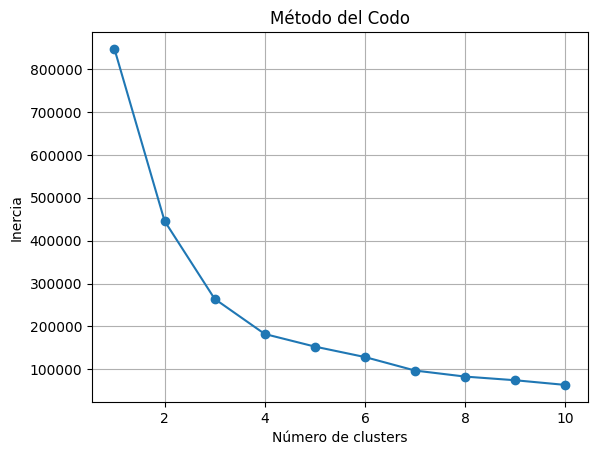

In [ ]:
# Ver numero ideal de clusters con el metodo del codo
inertia = []
K = range(1, 11)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_train_model4[['latitude', 'longitude']])
    inertia.append(kmeans.inertia_)

plt.plot(K, inertia, marker='o')
plt.xlabel('Número de clusters')
plt.ylabel('Inercia')
plt.title('Método del Codo')
plt.grid(True)
plt.show()

In [ ]:
# Voy a dejarlo en 7 clusters sin pasar a un analisis de Silhouette Score, solo teniendo en cuenta el gráfico
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from math import radians

#Clusterización geográfica con KMeans
coords = df_train_model4[['latitude', 'longitude']].dropna().copy()
coords_rad = np.radians(coords) # Convertir grados a radianes
scaler = StandardScaler() # Escalar
coords_scaled = scaler.fit_transform(coords_rad)

# Clustering con KMeans
kmeans = KMeans(n_clusters=7, random_state=42)
df_train_model4['geo_cluster'] = kmeans.fit_predict(coords_scaled)

# Guardar el modelo KMeans
with open('kmeans_model.pkl', 'wb') as f:
    pickle.dump(kmeans, f)

# Guardar el scaler
with open('scaler_coords.pkl', 'wb') as f:
    pickle.dump(scaler, f)

In [ ]:
# Buscar en que variable está la capital
capital_df = df_train_model4[df_train_model4['region'] == 'Dodoma']
capital_df.head()

,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,water_quality,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,waterpoint_type_group,date_recorded_year,management,management_group,payment,source,years_old,status_group,geo_cluster
30,0.0,Other,1194.0,Other,36.108312,-5.791000,con_nombre,Wami / Ruvu,Other,Dodoma,1.0,4.0,Other,Other,150.0,1.0,VWC,Other,1.0,2000.0,nira/tanira,nira/tanira,handpump,soft,good,insufficient,insufficient,shallow well,groundwater,hand pump,hand pump,2011,vwc,user-group,never pay,shallow well,13.0,functional,5
37,0.0,Other,1194.0,DWE,35.858373,-4.647906,con_nombre,Internal,Other,Dodoma,1.0,1.0,Other,Other,150.0,1.0,VWC,Other,0.0,2000.0,gravity,gravity,gravity,soft,good,enough,enough,spring,groundwater,communal standpipe,communal standpipe,2011,vwc,user-group,pay monthly,spring,13.0,functional,0
89,0.0,Other,1194.0,Other,35.878172,-5.891868,con_nombre,Wami / Ruvu,Other,Dodoma,1.0,5.0,Other,Other,150.0,1.0,VWC,Other,0.0,2000.0,mono,mono,motorpump,soft,good,insufficient,insufficient,borehole,groundwater,communal standpipe multiple,communal standpipe,2011,vwc,user-group,pay per bucket,machine dbh,13.0,functional needs repair,5
114,0.0,Other,1194.0,Other,36.557029,-6.372797,con_nombre,Wami / Ruvu,Other,Dodoma,1.0,1.0,Other,Other,150.0,1.0,VWC,Other,1.0,2000.0,gravity,gravity,gravity,soft,good,enough,enough,spring,groundwater,communal standpipe,communal standpipe,2011,vwc,user-group,pay per bucket,spring,13.0,non functional,5
242,0.0,Other,1194.0,Other,35.627591,-6.031137,con_nombre,Internal,Other,Dodoma,1.0,5.0,Other,Other,150.0,1.0,VWC,Other,0.0,2000.0,mono,mono,motorpump,soft,good,dry,dry,borehole,groundwater,communal standpipe,communal standpipe,2011,private operator,commercial,pay per bucket,machine dbh,13.0,non functional,5


In [ ]:
from geopy.distance import geodesic
# Coordenadas de Dodoma (Tanzania)
lat_mean = capital_df['latitude'].mean()
lon_mean = capital_df['longitude'].mean()
capital_coords = (lat_mean, lon_mean)

# Columna con distancia en km a la capital
df_train_model4['dist_to_capital_km'] = df_train_model4.apply(
    lambda row: geodesic((row['latitude'], row['longitude']), capital_coords).km,
    axis=1)

In [ ]:
# Calcular la población cercana
from sklearn.neighbors import NearestNeighbors
k = 10
nbrs = NearestNeighbors(n_neighbors=k+1, algorithm='ball_tree', metric='haversine')
nbrs.fit(coords_rad)
distances, indices = nbrs.kneighbors(coords_rad)

# Sumar poblaciones de vecinos cercanos (excluyendo el propio punto)
densities = []
for i, neighbors in enumerate(indices):
    neighbor_pops = df_train_model4.iloc[neighbors[1:]]['population'].sum()
    densities.append(neighbor_pops)

df_train_model4['nearby_population_density_knn'] = densities

# Guardar el modelo de vecinos
with open('nbrs_model.pkl', 'wb') as f:
    pickle.dump(nbrs, f)

In [ ]:
# Aplicar Label Encoder
df_train_model4_encode = df_train_model4.copy()
categoricas = [col for col in df_train_model4_encode.columns if df_train_model4_encode[col].dtype == 'object']
label_encoders_model4 = {}

for col in categoricas:
    le = LabelEncoder()
    df_train_model4_encode[col] = le.fit_transform(df_train_model4_encode[col].astype(str))
    label_encoders_model4[col] = le
with open('label_encoders_model4.pkl', 'wb') as f:
    pickle.dump(label_encoders_model4, f)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df_train_model4_encode.drop('status_group',axis=1),
                                                    df_train_model4_encode.status_group,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = df_train_model4_encode.status_group)

In [ ]:
# Hacer Oversampling
y_train = pd.Series(y_train)
class_counts = y_train.value_counts()
min_class = class_counts.idxmin()
max_count = class_counts.max()
sampling_strategy = {min_class: int(max_count * 0.3)}
print("Modificado:", sampling_strategy)
sm = SMOTE(random_state=2, sampling_strategy=sampling_strategy)
X_train, y_train = sm.fit_resample(X_train, y_train)

Modificado: {np.int64(1): 7742}


In [ ]:
model4 = XGBClassifier(
    n_estimators=1000,
    max_depth=8,
    learning_rate=0.03,
    subsample=0.9,
    colsample_bytree=0.9,
    gamma=1,
    reg_alpha=0.1,
    reg_lambda=1,
    random_state=42,
    eval_metric='mlogloss'
)

model4.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=1, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.03, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=8,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=1000,
              n_jobs=None, num_parallel_tree=None, objective='multi:softprob', ...)

In [ ]:
y_pred = model4.predict(X_test)

In [ ]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.7948653198653198


In [ ]:
# Cargar objetos entrenados
with open('scaler_coords.pkl', 'rb') as f:
    scaler = pickle.load(f)

with open('kmeans_model.pkl', 'rb') as f:
    kmeans = pickle.load(f)

with open('nbrs_model.pkl', 'rb') as f:
    nbrs = pickle.load(f)

with open('label_encoders_model4.pkl', 'rb') as f:
    label_encoders_test = pickle.load(f)

df_test_model4 = df_test.copy()

# Eliminar variables no utilizadas
df_test_model4.drop(columns=['id','num_private', 'recorded_by', 'payment_type'], inplace=True)

df_test_model4.loc[df_test_model4['gps_height'] <= 0, 'gps_height'] = np.nan
df_test_model4.loc[df_test_model4['longitude'] == 0, 'longitude'] = np.nan
df_test_model4.loc[(df_test_model4['latitude'] > -1), 'latitude'] = np.nan
df_test_model4.loc[df_test_model4['wpt_name'].str.len() <= 1, 'wpt_name'] = np.nan
df_test_model4.loc[df_test_model4['subvillage'].str.len() <= 1, 'subvillage'] = np.nan
def clean_region_code(code):
    if code > 21:
        if code % 10 == 0:
            return int(str(code)[0])
        else:
            return np.nan
    else:
        return code
df_test_model4['region_code'] = df_test_model4['region_code'].apply(clean_region_code)
df_test_model4.loc[df_test_model4['population'] == 0, 'population'] = np.nan
df_test_model4.loc[df_test_model4['scheme_name'].str.len() <= 1, 'scheme_name'] = np.nan
df_test_model4.loc[df_test_model4['construction_year'] == 0, 'construction_year'] = np.nan

# Wisorización
df_test_model4['amount_tsh'] = winsor_zscore(df_test_model4['amount_tsh'])
df_test_model4['district_code'] = winsor_zscore(df_test_model4['district_code'])
df_test_model4['population'] = winsor_zscore(df_test_model4['population'])

# Concertir en binarias categorias seleccionadas
categoricas_binarias = ['permit', 'public_meeting']
for j in categoricas_binarias:
    df_test_model4[j] = [0 if x == False else 1 for x in df_test_model4[j]]
df_test_model4['amount_tsh'] = [0 if x == 0 else 1 for x in df_test_model4['amount_tsh']]

# Crear la variable de fecha years_old, date recorded_year
# Crear columna con el año de date_recorded (igual que en train)
df_test_model4['date_recorded_year'] = df_test_model4['date_recorded'].dt.year
# Reemplazar construction_year = 0 por NaN
df_test_model4['construction_year'] = df_test_model4['construction_year'].replace(0, np.nan)
# Crear columna years_old
df_test_model4['years_old'] = df_test_model4['date_recorded_year'] - df_test_model4['construction_year']
df_test_model4.drop(columns = 'date_recorded', inplace = True)

# Unir en las variables: "management", "management_group", "payment", "payment_type", "source", las categorias unknown y other en una sola
variables_unificar = ["management", "management_group", "payment", "source"]
for var in variables_unificar:
    df_test_model4[var] = df_test_model4[var].replace('unknown', 'others')
    unknown_remaining = (df_train_clean[var] == 'unknown').sum()

# Filtrado para igualar df
ordered_columns = [
    'amount_tsh', 'funder', 'gps_height', 'installer', 'longitude', 'latitude',
    'wpt_name', 'basin', 'subvillage', 'region', 'region_code', 'district_code',
    'lga', 'ward', 'population', 'public_meeting', 'scheme_management', 'scheme_name',
    'permit', 'construction_year', 'extraction_type', 'extraction_type_group',
    'extraction_type_class', 'water_quality', 'quality_group', 'quantity',
    'quantity_group', 'source_type', 'source_class', 'waterpoint_type',
    'waterpoint_type_group', 'date_recorded_year', 'management', 'management_group',
    'payment', 'source', 'years_old', 'geo_cluster',
    'dist_to_capital_km', 'nearby_population_density_knn'
]
# Reordenar DataFrame
df_test_model4 = df_test_model4.reindex(columns=ordered_columns)

# Imputar numericas con mediana y categoricas con moda
df_test_model4[num_cols] = imputer_num.transform(df_test_model4[num_cols])
df_test_model4[cat_cols] = imputer_cat.transform(df_test_model4[cat_cols])

# Agrupar en fundado por el gobierno de Tanzania y no
df_test_model4["funder"].value_counts(normalize=True)
df_test_model4['funder'] = df_test_model4['funder'].apply(
    lambda x: 'Government of Tanzania' if 'government' in str(x).lower() and 'tanzania' in str(x).lower() else 'Other')
df_test_model4["funder"]

# Reducir categorias en installer según la proporción
instaladores_validos = ['DWE', 'Government', 'RWE']
df_test_model4['installer'] = df_test_model4['installer'].apply(
    lambda x: x if x in instaladores_validos else 'Other')

# Dividir en pozos con nombre y sin nombre
df_test_model4['wpt_name'] = df_test_model4['wpt_name'].apply(
    lambda x: 'sin_nombre' if 'none' in str(x).lower() else 'con_nombre')

# Reducir categorias en subvillage según la proporción
subvillage_validos = ['Madukani', 'Shuleni', 'Majengo', 'Kati', 'Mtakuja', 'Sokoni']
df_test_model4['subvillage'] = df_test_model4['subvillage'].apply(
    lambda x: x if x in subvillage_validos else 'Other')

# Reducir categorias en ward según la proporción
ward_validos = ['Igosi',
 'Imalinyi',
 'Siha Kati',
 'Mdandu',
 'Nduruma',
 'Mishamo',
 'Kitunda',
 'Msindo',
 'Chalinze',
 'Maji ya Chai',
 'Usuka']
df_test_model4['ward'] = df_test_model4['ward'].apply(
    lambda x: x if x in ward_validos else 'Other')

# Reducir categorias en lga según la proporción
lga_validos = ['Njombe',
 'Arusha Rural',
 'Moshi Rural',
 'Bariadi',
 'Rungwe',
 'Kilosa',
 'Kasulu',
 'Mbozi',
 'Meru',
 'Bagamoyo',
 'Singida Rural',
 'Kilombero']
df_test_model4['lga'] = df_test_model4['lga'].apply(
    lambda x: x if x in lga_validos else 'Other')

# Reducir categorias en scheme_name en Borehole y Other
df_test_model4['scheme_name'] = df_test_model4['scheme_name'].apply(
    lambda x: 'Borehole' if 'borehole' in str(x).lower() else 'Other')


# 1. Clusterización geográfica con KMeans (usar predict, no fit_predict)
coords = df_test_model4[['latitude', 'longitude']].copy()
coords_rad = np.radians(coords)
coords_scaled = scaler.transform(coords_rad)
df_test_model4['geo_cluster'] = kmeans.predict(coords_scaled)

# 2. Calcular distancia a la capital
capital_coords = (-6.1630, 35.7516)
from geopy.distance import geodesic
df_test_model4['dist_to_capital_km'] = df_test_model4.apply(
    lambda row: geodesic((row['latitude'], row['longitude']), capital_coords).km,
    axis=1
)

# 3. Calcular población cercana usando NearestNeighbors ya entrenado
# Asegurarse de que df_train_model4 tenga la columna 'population' y esté limpia
# (based on previous cell's global variables, this df exists)
coords_test_rad = np.radians(df_test_model4[['latitude', 'longitude']])
# Adjusting nbrs call to potentially handle fewer samples in test set if necessary, though not indicated as an issue here.
distances_test, indices_test = nbrs.kneighbors(coords_test_rad)

densities_test = []
# Ensure df_train_model4 is accessible and correctly indexed if needed
for i, neighbors in enumerate(indices_test):
    # Make sure the indices are valid for df_train_model4's current state
    valid_neighbors = [n for n in neighbors if n in df_train_model4.index]
    # Exclude the point itself (neighbor index 0 is the point itself in training data)
    neighbor_pops = df_train_model4.iloc[valid_neighbors[1:]]['population'].sum()
    densities_test.append(neighbor_pops)

df_test_model4['nearby_population_density_knn'] = densities_test

df_test_model4.head()

,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,water_quality,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,waterpoint_type_group,date_recorded_year,management,management_group,payment,source,years_old,geo_cluster,dist_to_capital_km,nearby_population_density_knn
0,0.0,Other,1996.0,Other,35.290799,-4.059696,con_nombre,Internal,Other,Manyara,21.0,3.0,Other,Other,321.0,1.0,Parastatal,Other,1.0,2012.0,other,other,other,soft,good,seasonal,seasonal,rainwater harvesting,surface,other,other,2013,parastatal,parastatal,never pay,rainwater harvesting,1.0,6,238.135223,2595.0
1,0.0,Government of Tanzania,1569.0,DWE,36.656709,-3.309214,con_nombre,Pangani,Other,Arusha,2.0,2.0,Arusha Rural,Other,300.0,1.0,VWC,Other,1.0,2000.0,gravity,gravity,gravity,soft,good,insufficient,insufficient,spring,groundwater,communal standpipe,communal standpipe,2013,vwc,user-group,never pay,spring,13.0,0,331.164834,2900.0
2,0.0,Other,1567.0,Other,34.767863,-5.004344,con_nombre,Internal,Other,Singida,13.0,2.0,Singida Rural,Other,500.0,1.0,VWC,Other,1.0,2010.0,other,other,other,soft,good,insufficient,insufficient,rainwater harvesting,surface,other,other,2013,vwc,user-group,never pay,rainwater harvesting,3.0,6,168.214956,10.0
3,0.0,Other,267.0,Other,38.058046,-9.418672,con_nombre,Ruvuma / Southern Coast,Other,Lindi,8.0,43.0,Other,Other,250.0,1.0,VWC,Other,1.0,1987.0,other,other,other,soft,good,dry,dry,shallow well,groundwater,other,other,2013,vwc,user-group,others,shallow well,26.0,4,440.844480,2600.0
4,1.0,Other,1260.0,Other,35.006123,-10.950412,con_nombre,Ruvuma / Southern Coast,Other,Ruvuma,10.0,3.0,Other,Other,60.0,1.0,Water Board,Other,1.0,2000.0,gravity,gravity,gravity,soft,good,enough,enough,spring,groundwater,communal standpipe,communal standpipe,2013,water board,user-group,pay monthly,spring,13.0,3,535.803807,1362.0


In [ ]:
# Aplicar LabelEncoder ya entrenados a df_test_model4
df_test_model4_encode = df_test_model4.copy()
for col, le in label_encoders_model4.items():
    if col in df_test_model4_encode.columns:
        df_test_model4_encode[col] = le.transform(df_test_model4_encode[col].astype(str))

In [ ]:
y_pred = model4.predict(df_test_model4_encode)

In [ ]:
prediccion4 = pd.DataFrame({'id': id, 'status_group': y_pred})
le_status = label_encoders_model4['status_group']
prediccion4['status_group'] = le_status.inverse_transform(prediccion4['status_group'])
prediccion4.to_csv('prediccion4.csv', index=False)

## **Modelo 5**
- Modelo 4 pero con Random Forest

In [ ]:
model5 = RandomForestClassifier().fit(X_train,y_train)

In [ ]:
y_pred = model5.predict(X_test)

In [ ]:
y_score = model5.predict_proba(X_test)
saca_metricas_multiclase(y_test, y_pred, y_score, classes=np.unique(y_train))

Matriz de Confusión
[[5645  262  545]
 [ 401  333  129]
 [ 871   97 3597]]
Accuracy: 0.805976430976431
Precision: 0.8018015942834059
Recall: 0.805976430976431
F1 Score: 0.8026058944782984


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      6452
           1       0.48      0.39      0.43       863
           2       0.84      0.79      0.81      4565

    accuracy                           0.81     11880
   macro avg       0.71      0.68      0.70     11880
weighted avg       0.80      0.81      0.80     11880



In [ ]:
plot_feature_importance(model5, X_train)

,Importance
dist_to_capital_km,0.101669
longitude,0.101471
latitude,0.096822
quantity,0.063199
quantity_group,0.056400
gps_height,0.046759
nearby_population_density_knn,0.038936
years_old,0.033731
construction_year,0.033572
waterpoint_type,0.033384


In [ ]:
y_pred = model5.predict(df_test_model4_encode)
prediccion5 = pd.DataFrame({'id': id, 'status_group': y_pred})
le_status = label_encoders_model4['status_group']
prediccion5['status_group'] = le_status.inverse_transform(prediccion5['status_group'])
prediccion5.to_csv('prediccion5.csv', index=False)

## **Modelo 6**
- Meter id al análisis
- Crear Variable nueva: Contar ocurrencias por funder e installer
funder_frequency:	Número de pozos financiados o instalados por esa entidad (frcuencias calculadas desde el df_train_clean_outlier y agregados a df_train_model6), puede entenderse como una medida de experiencia del fundador o instalador
- Categorizar población del punto de agua: muy baja (<500), baja (500-2000),media (2000–5000), alta (>5000)


In [ ]:
# Agregar Id al análisis
df_train_model6 = df_train_model4.copy()
df_train_model6['id'] = id_train
df_train_model6['status_group'] = df_train_clean['status_group']

# Reordenar columnas: poner 'id' primero
cols = ['id'] + [col for col in df_train_model6.columns if col != 'id']
df_train_model6 = df_train_model6[cols]

In [ ]:
# Contar ocurrencias de cada funder e installer en el dataset original para annadirlas luego
funder_freq = df_train_clean_outlier['funder'].value_counts().to_dict()
installer_freq = df_train_clean_outlier['installer'].value_counts().to_dict()

df_train_clean_outlier['funder_frequency'] = df_train_clean_outlier['funder'].map(funder_freq).astype('Int64')
df_train_clean_outlier['installer_frequency'] = df_train_clean_outlier['installer'].map(installer_freq).astype('Int64')

# Agregar columnas nuevas a df_train_model6
df_train_model6['funder_frequency'] = df_train_clean_outlier['funder_frequency']
df_train_model6['installer_frequency'] = df_train_clean_outlier['installer_frequency']

In [ ]:
def categorizar_poblacion(df):
    condiciones = [
        (df['population'] < 500),
        (df['population'] >= 500) & (df['population'] < 2000),
        (df['population'] >= 2000) & (df['population'] < 5000),
        (df['population'] >= 5000)
    ]
    categorias = ['muy_baja', 'baja', 'media', 'alta']
    df['population_cat'] = np.select(condiciones, categorias, default='desconocido')
    return df.head()
categorizar_poblacion(df_train_model6)

,id,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,water_quality,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,waterpoint_type_group,date_recorded_year,management,management_group,payment,source,years_old,status_group,geo_cluster,dist_to_capital_km,nearby_population_density_knn,funder_frequency,installer_frequency,population_cat
0,69572,1.0,Other,1390.0,Other,34.938093,-9.856322,sin_nombre,Lake Nyasa,Other,Iringa,11.0,5.0,Other,Other,109.0,1.0,VWC,Other,0.0,1999.0,gravity,gravity,gravity,soft,good,enough,enough,spring,groundwater,communal standpipe,communal standpipe,2011,vwc,user-group,pay annually,spring,12.0,functional,3,451.166543,1347.0,275,94,muy_baja
1,8776,0.0,Other,1399.0,Other,34.698766,-2.147466,con_nombre,Lake Victoria,Other,Mara,20.0,2.0,Other,Other,280.0,1.0,Other,Other,1.0,2010.0,gravity,gravity,gravity,soft,good,insufficient,insufficient,rainwater harvesting,surface,communal standpipe,communal standpipe,2013,wug,user-group,never pay,rainwater harvesting,3.0,functional,6,444.013256,1800.0,53,39,muy_baja
2,34310,1.0,Other,686.0,Other,37.460664,-3.821329,con_nombre,Pangani,Majengo,Manyara,21.0,4.0,Other,Other,250.0,1.0,VWC,Other,1.0,2009.0,gravity,gravity,gravity,soft,good,enough,enough,dam,surface,communal standpipe multiple,communal standpipe,2013,vwc,user-group,pay per bucket,dam,4.0,functional,0,281.054063,2940.0,8,408,muy_baja
3,67743,0.0,Other,263.0,Other,38.486161,-11.155298,con_nombre,Ruvuma / Southern Coast,Other,Mtwara,9.0,53.0,Other,Other,58.0,1.0,VWC,Other,1.0,1986.0,submersible,submersible,submersible,soft,good,dry,dry,borehole,groundwater,communal standpipe multiple,communal standpipe,2013,vwc,user-group,never pay,machine dbh,27.0,non functional,4,637.473545,1009.0,1057,222,muy_baja
4,19728,0.0,Other,1194.0,Other,31.130847,-1.825359,con_nombre,Lake Victoria,Other,Kagera,18.0,1.0,Other,Other,150.0,1.0,VWC,Other,1.0,2000.0,gravity,gravity,gravity,soft,good,seasonal,seasonal,rainwater harvesting,surface,communal standpipe,communal standpipe,2011,other,other,never pay,rainwater harvesting,13.0,functional,2,709.615923,1500.0,1,135,muy_baja


In [ ]:
# Separar columnas numéricas y categóricas
num_cols = df_train_model6.select_dtypes(include=['int64', 'float64']).columns
cat_cols = df_train_model6.select_dtypes(include=['object', 'category']).columns
cat_cols = [col for col in cat_cols if col != 'status_group']

# Imputar numericas con mediana
imputer_num = SimpleImputer(strategy='median')
df_train_model6[num_cols] = imputer_num.fit_transform(df_train_model6[num_cols])

# IMputar categoricas con moda
imputer_cat = SimpleImputer(strategy='most_frequent')
df_train_model6[cat_cols] = imputer_cat.fit_transform(df_train_model6[cat_cols])

df_train_model6.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 45 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id                             59400 non-null  float64
 1   amount_tsh                     59400 non-null  float64
 2   funder                         59400 non-null  object 
 3   gps_height                     59400 non-null  float64
 4   installer                      59400 non-null  object 
 5   longitude                      59400 non-null  float64
 6   latitude                       59400 non-null  float64
 7   wpt_name                       59400 non-null  object 
 8   basin                          59400 non-null  object 
 9   subvillage                     59400 non-null  object 
 10  region                         59400 non-null  object 
 11  region_code                    59400 non-null  float64
 12  district_code                  59400 non-null 

In [ ]:
# Aplicar Label Encoder
df_train_model6_encode = df_train_model6.copy()
categoricas = [col for col in df_train_model6_encode.columns if df_train_model6_encode[col].dtype == 'object']
label_encoders_model6 = {}

for col in categoricas:
    le = LabelEncoder()
    df_train_model6_encode[col] = le.fit_transform(df_train_model6_encode[col].astype(str))
    label_encoders_model6[col] = le
with open('label_encoders_model6.pkl', 'wb') as f:
    pickle.dump(label_encoders_model6, f)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df_train_model6_encode.drop('status_group',axis=1),
                                                    df_train_model6_encode.status_group,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = df_train_model6_encode.status_group)

In [ ]:
# Hacer Oversampling
y_train = pd.Series(y_train)
class_counts = y_train.value_counts()
min_class = class_counts.idxmin()
max_count = class_counts.max()
sampling_strategy = {min_class: int(max_count * 0.3)}
print("Modificado:", sampling_strategy)
sm = SMOTE(random_state=2, sampling_strategy=sampling_strategy)
X_train, y_train = sm.fit_resample(X_train, y_train)

Modificado: {np.int64(1): 7742}


In [ ]:
model6 = RandomForestClassifier().fit(X_train,y_train)

In [ ]:
y_pred = model6.predict(X_test)

In [ ]:
y_score = model6.predict_proba(X_test)
saca_metricas_multiclase(y_test, y_pred, y_score, classes=np.unique(y_train))

Matriz de Confusión
[[5776  175  501]
 [ 437  290  136]
 [ 935   80 3550]]
Accuracy: 0.8094276094276094
Precision: 0.8033076180423573
Recall: 0.8094276094276094
F1 Score: 0.8029652204772242


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.81      0.90      0.85      6452
           1       0.53      0.34      0.41       863
           2       0.85      0.78      0.81      4565

    accuracy                           0.81     11880
   macro avg       0.73      0.67      0.69     11880
weighted avg       0.80      0.81      0.80     11880



In [ ]:
plot_feature_importance(model6, X_train)

,Importance
longitude,0.074226
latitude,0.073147
dist_to_capital_km,0.072838
quantity_group,0.059277
id,0.058119
quantity,0.052628
gps_height,0.039226
nearby_population_density_knn,0.031910
waterpoint_type,0.031299
years_old,0.030781


In [ ]:
with open('label_encoders_model6.pkl', 'rb') as f:
    label_encoders_model6 = pickle.load(f)

df_test_model6 = df_test_model4.copy()
df_test_model6['id'] = id

cols = ['id'] + [col for col in df_test_model6.columns if col != 'id']
df_test_model6 = df_test_model6[cols]

def categorizar_poblacion(df):
    condiciones = [
        (df['population'] < 500),
        (df['population'] >= 500) & (df['population'] < 2000),
        (df['population'] >= 2000) & (df['population'] < 5000),
        (df['population'] >= 5000)
    ]
    categorias = ['muy_baja', 'baja', 'media', 'alta']
    df['population_cat'] = np.select(condiciones, categorias, default='desconocido')
    return df
df_test_model6 = categorizar_poblacion(df_test_model6)

num_cols = df_test_model6.select_dtypes(include=['int64', 'float64', 'Int64']).columns
cat_cols = df_test_model6.select_dtypes(include=['object', 'category']).columns
df_test_model6[num_cols] = imputer_num.fit_transform(df_test_model6[num_cols])
df_test_model6[cat_cols] = imputer_cat.fit_transform(df_test_model6[cat_cols])

df_test_model6['funder_frequency'] = df_test['funder'].map(funder_freq).fillna(0).astype('Int64')
df_test_model6['installer_frequency'] = df_test['installer'].map(installer_freq).fillna(0).astype('Int64')

df_test_model6 = df_test_model6[df_train_model6.columns.drop('status_group')]

df_test_model6_encode = df_test_model6.copy()
for col, le in label_encoders_model6.items():
    if col in df_test_model6_encode.columns:
        df_test_model6_encode[col] = le.transform(df_test_model6_encode[col].astype(str))

df_test_model6_encode.head()

,id,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,water_quality,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,waterpoint_type_group,date_recorded_year,management,management_group,payment,source,years_old,geo_cluster,dist_to_capital_km,nearby_population_density_knn,funder_frequency,installer_frequency,population_cat
0,50785.0,0.0,1,1996.0,2,35.290799,-4.059696,0,0,4,8,21.0,3.0,10,9,321.0,1.0,2,1,1.0,2012.0,9,6,3,6,2,3,3,3,1,6,5,2013,4,3,0,6,1.0,6,238.135223,2595.0,186,89,2
1,51630.0,0.0,0,1569.0,0,36.656709,-3.309214,0,5,4,0,2.0,2.0,0,9,300.0,1.0,6,1,1.0,2000.0,3,1,0,6,2,2,2,6,0,1,1,2013,7,4,0,9,13.0,0,331.164834,2900.0,9084,17402,2
2,17168.0,0.0,1,1567.0,2,34.767863,-5.004344,0,0,4,18,13.0,2.0,12,9,500.0,1.0,6,1,1.0,2010.0,9,6,3,6,2,2,2,3,1,6,5,2013,7,4,0,6,3.0,6,168.214956,10.0,0,0,0
3,45559.0,0.0,1,267.0,2,38.058046,-9.418672,0,7,4,7,8.0,43.0,10,9,250.0,1.0,6,1,1.0,1987.0,9,6,3,6,2,0,0,5,0,6,5,2013,7,4,2,8,26.0,4,440.844480,2600.0,33,33,2
4,49871.0,1.0,1,1260.0,2,35.006123,-10.950412,0,7,4,16,10.0,3.0,10,9,60.0,1.0,9,1,1.0,2000.0,3,1,0,6,2,1,1,6,0,1,1,2013,9,4,4,9,13.0,3,535.803807,1362.0,16,16,2


In [ ]:
y_pred = model6.predict(df_test_model6_encode)
prediccion6 = pd.DataFrame({'id': id, 'status_group': y_pred})
le_status = label_encoders_model4['status_group']
prediccion6['status_group'] = le_status.inverse_transform(prediccion6['status_group'])
prediccion6.to_csv('prediccion6.csv', index=False)

## **Modelo 7**

- Trabajar con _nan e imputar a ver que da


In [ ]:
df_train_model7 = df_train_model6.copy()

In [ ]:
# Seleccionar columnas de df_train_clean_outlier que terminan en 'nan'
cols_nan = [col for col in df_train_clean_outlier.columns if col.endswith('nan')]

# Agregar esas columnas a df_train_model7 (alineadas por índice)
df_train_model7[cols_nan] = df_train_clean_outlier[cols_nan]

In [ ]:
df_train_model7.head(1)

,id,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,water_quality,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,waterpoint_type_group,date_recorded_year,management,management_group,payment,source,years_old,status_group,geo_cluster,dist_to_capital_km,nearby_population_density_knn,funder_frequency,installer_frequency,population_cat,management_nan,management_group_nan,payment_nan,payment_type_nan,source_nan,water_quality_nan,quality_group_nan,quantity_nan,quantity_group_nan,source_class_nan
0,69572.0,1.0,Other,1390.0,Other,34.938093,-9.856322,sin_nombre,Lake Nyasa,Other,Iringa,11.0,5.0,Other,Other,109.0,1.0,VWC,Other,0.0,1999.0,gravity,gravity,gravity,soft,good,enough,enough,spring,groundwater,communal standpipe,communal standpipe,2011,vwc,user-group,pay annually,spring,12.0,functional,3,451.166543,1347.0,275.0,94.0,muy_baja,vwc,user-group,pay annually,annually,spring,soft,good,enough,enough,groundwater


In [ ]:
df_train_model7.drop('payment_type_nan', axis = 1, inplace = True)
col_nan = ["management", "management_group", "payment", "source", "water_quality", "quality_group", "quantity", "quantity_group", "source_class"]

# Eliminar recorded_by y variables terminadas en _mix
df_train_model7.drop(columns = col_nan, inplace=True)

# Eliminar sufijo _nan
df_train_model7.columns = df_train_model7.columns.str.replace('_nan', '')

In [ ]:
df_train_model7.head(1)

,id,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,source_type,waterpoint_type,waterpoint_type_group,date_recorded_year,years_old,status_group,geo_cluster,dist_to_capital_km,nearby_population_density_knn,funder_frequency,installer_frequency,population_cat,management,management_group,payment,source,water_quality,quality_group,quantity,quantity_group,source_class
0,69572.0,1.0,Other,1390.0,Other,34.938093,-9.856322,sin_nombre,Lake Nyasa,Other,Iringa,11.0,5.0,Other,Other,109.0,1.0,VWC,Other,0.0,1999.0,gravity,gravity,gravity,spring,communal standpipe,communal standpipe,2011,12.0,functional,3,451.166543,1347.0,275.0,94.0,muy_baja,vwc,user-group,pay annually,spring,soft,good,enough,enough,groundwater


In [ ]:
# Separar columnas numéricas y categóricas
num_cols = df_train_model7.select_dtypes(include=['int64', 'float64']).columns
cat_cols = df_train_model7.select_dtypes(include=['object', 'category']).columns
cat_cols = [col for col in cat_cols if col != 'status_group']

# Imputar numericas con mediana
imputer_num = SimpleImputer(strategy='median')
df_train_model7[num_cols] = imputer_num.fit_transform(df_train_model7[num_cols])

# IMputar categoricas con moda
imputer_cat = SimpleImputer(strategy='most_frequent')
df_train_model7[cat_cols] = imputer_cat.fit_transform(df_train_model7[cat_cols])

In [ ]:
# Aplicar Label Encoder
df_train_model7_encode = df_train_model7.copy()
categoricas = [col for col in df_train_model7_encode.columns if df_train_model7_encode[col].dtype == 'object']
label_encoders_model7 = {}
for col in categoricas:
    le = LabelEncoder()
    df_train_model7_encode[col] = le.fit_transform(df_train_model7_encode[col].astype(str))
    label_encoders_model7[col] = le
with open('label_encoders_model7.pkl', 'wb') as f:
    pickle.dump(label_encoders_model7, f)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df_train_model7_encode.drop('status_group',axis=1),
                                                    df_train_model7_encode.status_group,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = df_train_model7_encode.status_group)

In [ ]:
# Hacer Oversampling
y_train = pd.Series(y_train)
class_counts = y_train.value_counts()
min_class = class_counts.idxmin()
max_count = class_counts.max()
sampling_strategy = {min_class: int(max_count * 0.3)}
print("Modificado:", sampling_strategy)
sm = SMOTE(random_state=2, sampling_strategy=sampling_strategy)
X_train, y_train = sm.fit_resample(X_train, y_train)

Modificado: {np.int64(1): 7742}


In [ ]:
model7 = RandomForestClassifier().fit(X_train,y_train)

In [ ]:
y_pred = model7.predict(X_test)
y_score = model7.predict_proba(X_test)
saca_metricas_multiclase(y_test, y_pred, y_score, classes=np.unique(y_train))

Matriz de Confusión
[[5755  194  503]
 [ 440  283  140]
 [ 917   79 3569]]
Accuracy: 0.8086700336700336
Precision: 0.8020457037914376
Recall: 0.8086700336700336
F1 Score: 0.8023349862364447


In [ ]:
print(classification_report(y_test, y_pred))
plot_feature_importance(model7, X_train)

              precision    recall  f1-score   support

           0       0.81      0.89      0.85      6452
           1       0.51      0.33      0.40       863
           2       0.85      0.78      0.81      4565

    accuracy                           0.81     11880
   macro avg       0.72      0.67      0.69     11880
weighted avg       0.80      0.81      0.80     11880



,Importance
longitude,0.074884
latitude,0.074317
dist_to_capital_km,0.074006
id,0.060032
quantity,0.058569
quantity_group,0.054728
gps_height,0.039499
waterpoint_type,0.034615
nearby_population_density_knn,0.032297
construction_year,0.030193


In [ ]:
with open('label_encoders_model7.pkl', 'rb') as f:
    label_encoders_model7 = pickle.load(f)

df_test_model7 = df_test_model4.copy()
df_test_model7['id'] = id

cols = ['id'] + [col for col in df_test_model7.columns if col != 'id']
df_test_model7 = df_test_model7[cols]

df_test_model7 = categorizar_poblacion(df_test_model7)

# Reemplazar 'other' y 'unknown' por np.nan en las que antes eran _nan
for col in df_test_model7.columns:
    if col in col_nan:
        df_test_model7[col] = df_test_model7[col].replace(['other', 'others', 'unknown'], np.nan)

num_cols = df_test_model7.select_dtypes(include=['int64', 'float64', 'Int64']).columns
cat_cols = df_test_model7.select_dtypes(include=['object', 'category']).columns
df_test_model7[num_cols] = imputer_num.fit_transform(df_test_model7[num_cols])
df_test_model7[cat_cols] = imputer_cat.fit_transform(df_test_model7[cat_cols])

df_test_model7['funder_frequency'] = df_test['funder'].map(funder_freq).fillna(0).astype('Int64')
df_test_model7['installer_frequency'] = df_test['installer'].map(installer_freq).fillna(0).astype('Int64')

df_test_model7 = df_test_model7[df_train_model7.columns.drop('status_group')]

df_test_model7_encode = df_test_model7.copy()

for col, le in label_encoders_model7.items():
    if col in df_test_model7_encode.columns:
        df_test_model7_encode[col] = le.transform(df_test_model7_encode[col].astype(str))

In [ ]:
y_pred = model7.predict(df_test_model7_encode)
prediccion7 = pd.DataFrame({'id': id, 'status_group': y_pred})
le_status = label_encoders_model7['status_group']
prediccion7['status_group'] = le_status.inverse_transform(prediccion7['status_group'])
prediccion7.to_csv('prediccion7.csv', index=False)

## **Modelo 8**
- Eliminando y agregando algunas variables a partir de df_train_model_6 ya que no se vio reflejada mejora en submissions

Este análisis es más desde un punto de simplificar cantidad de variables (correlacionadas) y ver que tanto esas variables me estaban aportando o restando, y ver que pasa al eliminarlas

In [ ]:
df_train_model8 = df_train_model6.copy()
df_train_model8.head(1)

,id,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,water_quality,quality_group,quantity,quantity_group,source_type,source_class,waterpoint_type,waterpoint_type_group,date_recorded_year,management,management_group,payment,source,years_old,status_group,geo_cluster,dist_to_capital_km,nearby_population_density_knn,funder_frequency,installer_frequency,population_cat
0,69572.0,1.0,Other,1390.0,Other,34.938093,-9.856322,sin_nombre,Lake Nyasa,Other,Iringa,11.0,5.0,Other,Other,109.0,1.0,VWC,Other,0.0,1999.0,gravity,gravity,gravity,soft,good,enough,enough,spring,groundwater,communal standpipe,communal standpipe,2011,vwc,user-group,pay annually,spring,12.0,functional,3,451.166543,1347.0,275.0,94.0,muy_baja


In [ ]:
# Eliminar variables redundantes que se plantearon en el analisis exploratorio
#variables_eliminar = ['recorded_by', 'quantity_group','waterpoint_type_group', 'management_group', 'scheme_management', 'extraction_type_class', 'extraction_type_group', 'water_quality', 'source_type', 'source_class', ]
#variables_region = ["region", "basin", "ward", "subvillage", "region",'scheme_name']
#df_train_model8 = df_train_model8.drop(columns=variables_region)
#df_train_model8.head()

# Agregar wpt_name sin tramificar a ver en que ayuda
df_train_model8['wpt_name'] = df_train_clean_outlier['wpt_name']

Eliminando las variables que me hacian un poco de ruido no disminuyó mucho la métrica, por lo que si presentara a negocio pensara en algo más simple, eliminando todas las variables marcadas anteriormente. Como se trata de un concurso, decidi ingresar wpt_name a ver que sucedía y resulta que me mejoró un poco la métrica en local, por lo que decidi probar y hacer una submission

In [ ]:
# Aplicar Label Encoder
df_train_model8_encode = df_train_model8.copy()
categoricas = [col for col in df_train_model8_encode.columns if df_train_model8_encode[col].dtype == 'object']
label_encoders_model8 = {}

for col in categoricas:
    le = LabelEncoder()
    df_train_model8_encode[col] = le.fit_transform(df_train_model8_encode[col].astype(str))
    label_encoders_model8[col] = le
with open('label_encoders_model8.pkl', 'wb') as f:
    pickle.dump(label_encoders_model8, f)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df_train_model8_encode.drop('status_group',axis=1),
                                                    df_train_model8_encode.status_group,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = df_train_model8_encode.status_group)

In [ ]:
y_train = pd.Series(y_train)
class_counts = y_train.value_counts()
min_class = class_counts.idxmin()
max_count = class_counts.max()
sampling_strategy = {min_class: int(max_count * 0.3)}
print("Modificado:", sampling_strategy)
sm = SMOTE(random_state=2, sampling_strategy=sampling_strategy)
X_train, y_train = sm.fit_resample(X_train, y_train)

Modificado: {np.int64(1): 7742}


In [ ]:
model8 = RandomForestClassifier().fit(X_train,y_train)

In [ ]:
y_pred = model8.predict(X_test)

In [ ]:
y_score = model8.predict_proba(X_test)
saca_metricas_multiclase(y_test, y_pred, y_score, classes=np.unique(y_train))

Matriz de Confusión
[[5789  173  490]
 [ 448  283  132]
 [ 959   74 3532]]
Accuracy: 0.8084175084175084
Precision: 0.8024191149781864
Recall: 0.8084175084175084
F1 Score: 0.8015628140330926


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.90      0.85      6452
           1       0.53      0.33      0.41       863
           2       0.85      0.77      0.81      4565

    accuracy                           0.81     11880
   macro avg       0.73      0.67      0.69     11880
weighted avg       0.80      0.81      0.80     11880



In [ ]:
plot_feature_importance(model8, X_train)

,Importance
longitude,0.068042
latitude,0.065993
dist_to_capital_km,0.065498
quantity,0.056639
quantity_group,0.054712
wpt_name,0.049683
id,0.048725
waterpoint_type,0.036041
gps_height,0.035770
amount_tsh,0.030831


In [ ]:
df_test_model8 = df_test_model6.copy()
df_test_model8['id'] = id
df_test_model8['wpt_name'] = df_test['wpt_name']

In [ ]:
df_test_model8_encode = df_test_model8.copy()

for col, le in label_encoders_model8.items():
    if col in df_test_model8_encode.columns:
        # Mapeamos todos los valores que no estén en le.classes_ a 'unknown'
        df_test_model8_encode[col] = df_test_model8_encode[col].astype(str)
        df_test_model8_encode[col] = df_test_model8_encode[col].apply(
            lambda x: x if x in le.classes_ else 'unknown'
        )

        # Agregar 'unknown' al encoder si no existe
        if 'unknown' not in le.classes_:
            le.classes_ = np.append(le.classes_, 'unknown')

        df_test_model8_encode[col] = le.transform(df_test_model8_encode[col])

In [ ]:
y_pred = model8.predict(df_test_model8_encode)
prediccion8 = pd.DataFrame({'id': id, 'status_group': y_pred})
le_status = label_encoders_model8['status_group']
prediccion8['status_group'] = le_status.inverse_transform(prediccion8['status_group'])
prediccion8.to_csv('prediccion8.csv', index=False)

---

# **Modelo Ganador**

Fuera de todo pronóstico, el ganador fue el **Modelo 1** con una puntuación de 0.8137. Este modelo es el más sencillo, e inicialmente fue el que peor métrica obtuvo, sin embargo, luego de realizarle ciertos cambios al modelo y al df, mejoró significativamente.

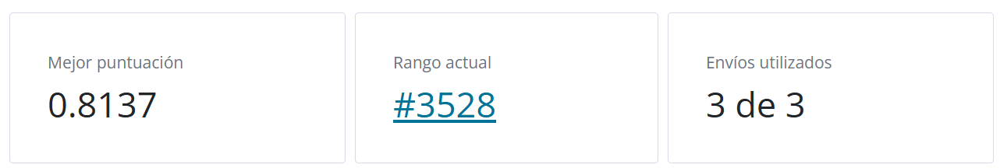

# **Capturas de pantalla de mis Submissions**

En total se realizaron 23 Submissions, dos de ellas con errores de subida debido a que no eliminaba la codificacion de la target.
El proceso inició con un modelo muy malo, que fue mejorando, aunque en el proceso existieron retrocesos, siendo la última subida (Modelo 1 modificado), la más alta.


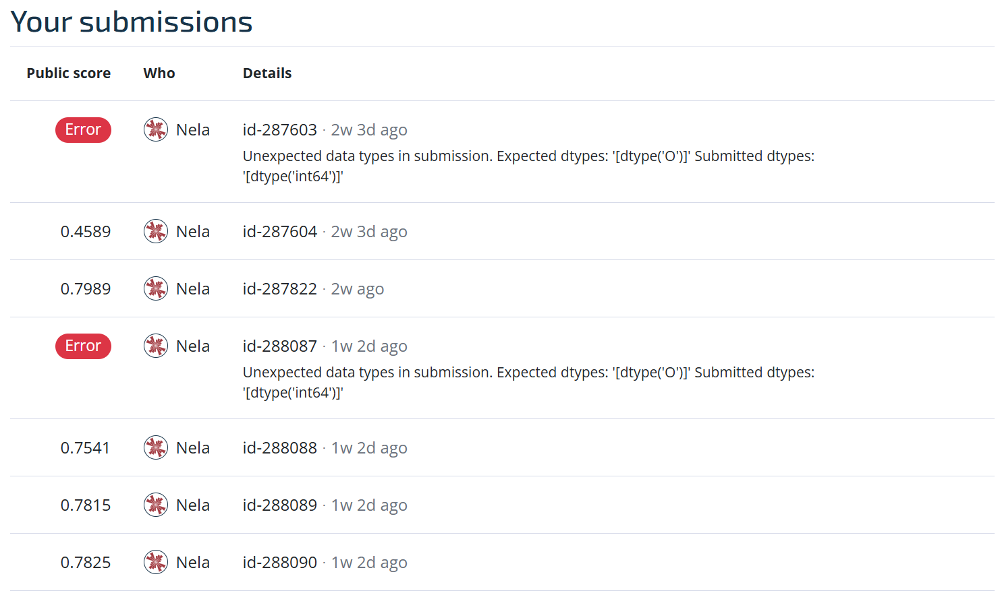
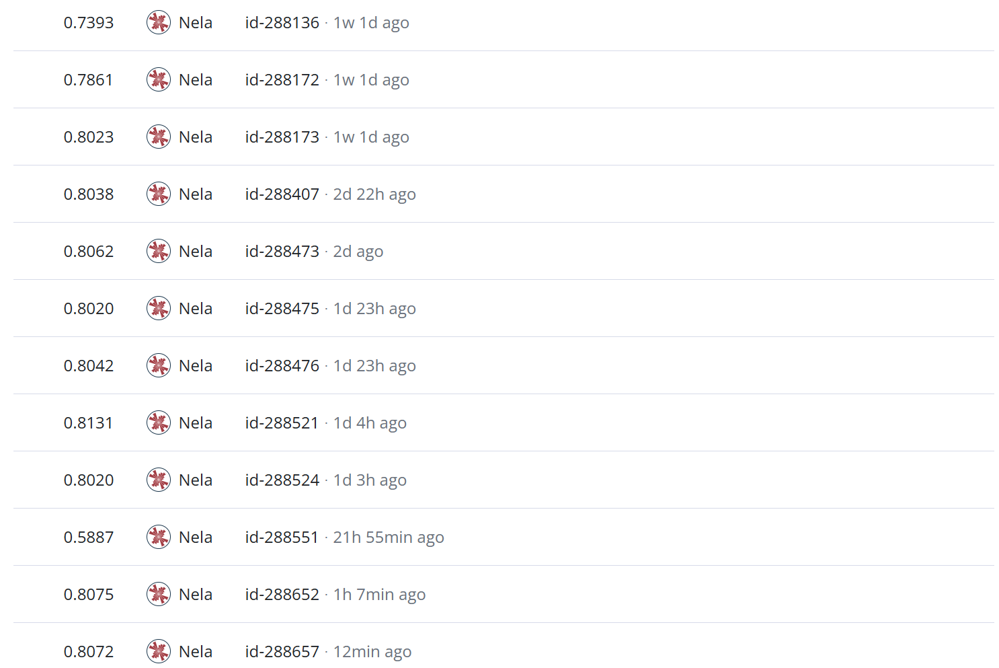
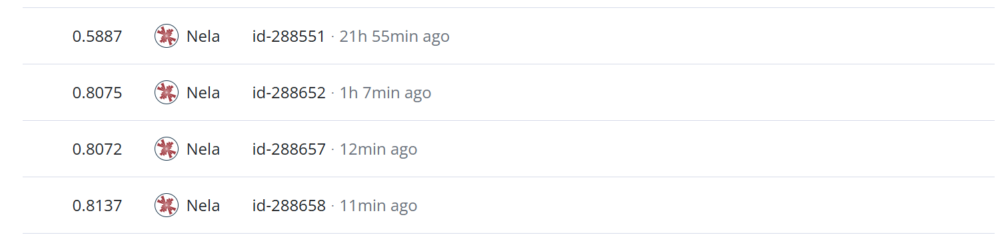

# **Conclusiones**

No siempre la creación o modificación de más variables implica una mejora en el desempeño del modelo; en muchos casos, la simplicidad favorece una mejor capacidad de generalización.

Por otro lado, dado que se trata de una competencia, es válido explotar al máximo las variables disponibles para optimizar métricas. Sin embargo, en un entorno empresarial, la interpretabilidad y la simplicidad del modelo suelen ser prioritarias, incluso por encima de mejoras marginales en el rendimiento.

# **Recomendaciones a mi trabajo para un futuro**

- Implementar un ensemble de modelos para mejorar la robustez y precisión.

- Aplicar codificación ordinal en variables relacionadas con la calidad del agua.

- Utilizar codificación por frecuencia en variables geográficas, así como en fundadores e instaladores.

Continuaré haciendo subidas y buscando mejorar el modelo luego de la entrega del presente trabajo
